In [ ]:
import os
import re
import cv2
import glob
import random
import shutil
import subprocess

import numpy as np
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageDraw, ImageFont
from pathlib import Path
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.utils as vutils
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
import torchvision.transforms.functional as TF

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, precision_recall_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, precision_recall_curve, auc, roc_curve, confusion_matrix, classification_report

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
device

device(type='cuda')

#### SVHN Dataset

In [ ]:
print("Current working directory:", os.getcwd())

Current working directory: /content


In [ ]:
base_dir = '/content'

In [ ]:
train_dir = os.path.join(base_dir,  'svhn_train_data')
test_dir  = os.path.join(base_dir,  'svhn_test_data')

In [ ]:
svhn_train = torchvision.datasets.SVHN( root = train_dir, split='train',  download = True)
svhn_test  = torchvision.datasets.SVHN( root = test_dir , split='test', download = True)

100%|██████████| 182M/182M [00:22<00:00, 8.25MB/s]
100%|██████████| 64.3M/64.3M [00:12<00:00, 5.30MB/s]


In [ ]:
svhn = '/content/svhn'
os.makedirs(svhn, exist_ok = True)

In [ ]:
train_pth = '/content/svhn/train'
os.makedirs(train_pth, exist_ok = True)

In [ ]:
for idx,(img, label) in enumerate(svhn_train):
  label_dir = os.path.join(train_pth, str(label))
  os.makedirs(label_dir, exist_ok = True)

  img_pth = os.path.join(label_dir, f"{idx}.png")
  img.save(img_pth)

In [ ]:
test_pth = '/content/svhn/test'
os.makedirs(test_pth, exist_ok = True)

In [ ]:
for idx, (img,label) in enumerate(svhn_test):
  label_dir = os.path.join(test_pth, str(label))
  os.makedirs(label_dir, exist_ok = True)

  img_pth = os.path.join(label_dir, f"{idx}.png")
  img.save(img_pth)

In [ ]:
garbage_dir = os.path.join(train_pth, "garbage")
os.makedirs(garbage_dir, exist_ok = True)

In [ ]:
!ls '/content/svhn/train'

0  1  2  3  4  5  6  7	8  9  garbage


In [ ]:
!ls '/content/svhn/test'

0  1  2  3  4  5  6  7	8  9


In [ ]:
for i in range(10):
  dir_pth = os.path.join(train_pth, f"{i}")
  dir_size = len([f for f in os.listdir(dir_pth) if os.path.isfile(os.path.join(dir_pth,f))])
  print(f"size of class{i}:{dir_size}")

size of class0:4948
size of class1:13861
size of class2:10585
size of class3:8497
size of class4:7458
size of class5:6882
size of class6:5727
size of class7:5595
size of class8:5045
size of class9:4659


In [ ]:
for i in range(10):
  dir_pth = os.path.join(test_pth, f"{i}")
  dir_size = len([f for f in os.listdir(dir_pth) if os.path.isfile(os.path.join(dir_pth,f))])
  print(f"size of class{i}:{dir_size}")

size of class0:1744
size of class1:5099
size of class2:4149
size of class3:2882
size of class4:2523
size of class5:2384
size of class6:1977
size of class7:2019
size of class8:1660
size of class9:1595


#### Guassian noise samples in garbage class

In [ ]:
# folder_path = garbage_dir
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

In [ ]:
# garbage_dir = os.path.join(train_pth, "garbage")
# os.makedirs(garbage_dir, exist_ok = True)

In [ ]:
noise_samples = 7325
print("Generating Gaussian noise samples for garbage class...")

for i in range(noise_samples):
    # Generate Gaussian noise (mean=0.5, std=0.15 to keep most values in reasonable range)
    random_noise = torch.randn(3, 32, 32) * 0.15 + 0.5
    random_noise = torch.clamp(random_noise, 0, 1)  # Ensure values are in [0, 1]

    # Convert to PIL Image (simulating the raw input format)
    random_noise_pil = transforms.ToPILImage()(random_noise)

    ood_image_pth = os.path.join(garbage_dir, f"noise_{i+1}.png")
    random_noise_pil.save(ood_image_pth)

print(f"Generated {noise_samples} Gaussian noise samples")

Generating Gaussian noise samples for garbage class...
Generated 7325 Gaussian noise samples


#### Transformations

In [ ]:
# def calculate_mean_std_color(dataset_loader):
#     """
#     Calculate mean and standard deviation for a color (3-channel) dataset
#     """

#     channels_sum, channels_squared_sum, num_batches = torch.zeros(3), torch.zeros(3), 0

#     for data, _ in dataset_loader:
#         # Sum over all pixels and all batches for each channel
#         channels_sum += torch.mean(data, dim=[0, 2, 3])
#         channels_squared_sum += torch.mean(data**2, dim=[0, 2, 3])
#         num_batches += 1

#     # mean and std
#     mean = channels_sum / num_batches
#     std = (channels_squared_sum / num_batches - mean**2)**0.5

#     return mean, std

# # Create transform
# transform = transforms.Compose([
#     transforms.ToTensor()
# ])

# print("Calculating for SVHN...")
# svhn_train = datasets.SVHN(root='./data', split='train', download=True, transform=transform)
# svhn_loader = DataLoader(svhn_train, batch_size=64, shuffle=False)
# svhn_mean, svhn_std = calculate_mean_std_color(svhn_loader)
# print(f""" SVHN - Mean: {svhn_mean.tolist()},
#             Std: {svhn_std.tolist()}""")

Calculating for SVHN...


100%|██████████| 182M/182M [00:20<00:00, 8.97MB/s]


 SVHN - Mean: [0.43770718574523926, 0.4437945485115051, 0.47282570600509644],
            Std: [0.19804376363754272, 0.2010250836610794, 0.19703803956508636]


In [ ]:
svhn_mean = (0.4377, 0.4438, 0.4728)
svhn_std  = (0.1980, 0.2010, 0.1970)

svhn_transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize(svhn_mean, svhn_std)])

In [ ]:
train_dataset = ImageFolder(root=train_pth, transform  = svhn_transform)
test_dataset  = ImageFolder(root=test_pth,  transform  = svhn_transform)

In [ ]:
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset , batch_size=batch_size, shuffle=False)

#### Checking Datasets and DataLoaders

In [ ]:
img, label = train_dataset[0]
print(type(img), img.shape)
print(type(label), label)

<class 'torch.Tensor'> torch.Size([3, 32, 32])
<class 'int'> 0


In [ ]:
img, label = train_dataset[61000]
print(type(img), img.shape)
print(type(label), label)

<class 'torch.Tensor'> torch.Size([3, 32, 32])
<class 'int'> 7


In [ ]:
len(train_dataset)

80582

In [ ]:
len(test_dataset)

26032

In [ ]:
train_dataset.samples[:5]

[('/content/svhn/train/0/10004.png', 0),
 ('/content/svhn/train/0/1002.png', 0),
 ('/content/svhn/train/0/10023.png', 0),
 ('/content/svhn/train/0/10025.png', 0),
 ('/content/svhn/train/0/10041.png', 0)]

In [ ]:
train_dataset.samples[-5:-1]

[('/content/svhn/train/garbage/noise_995.png', 10),
 ('/content/svhn/train/garbage/noise_996.png', 10),
 ('/content/svhn/train/garbage/noise_997.png', 10),
 ('/content/svhn/train/garbage/noise_998.png', 10)]

In [ ]:
len(train_loader)

2519

In [ ]:
len(test_loader)

814

In [ ]:
for imgs, labels in train_loader:
    print(type(imgs), imgs.shape)      # torch.Tensor [batch, 1, 28, 28]
    print(type(labels), labels.shape)  # torch.Tensor [batch]
    break

<class 'torch.Tensor'> torch.Size([32, 3, 32, 32])
<class 'torch.Tensor'> torch.Size([32])


In [ ]:
for imgs, labels in test_loader:
    print(type(imgs), imgs.shape)      # torch.Tensor [batch, 1, 28, 28]
    print(type(labels), labels.shape)  # torch.Tensor [batch]
    break

<class 'torch.Tensor'> torch.Size([32, 3, 32, 32])
<class 'torch.Tensor'> torch.Size([32])


In [ ]:
mean_sum = torch.zeros(3)
std_sum = torch.zeros(3)
total_samples = 0
# Calculate mean and std per batch
with torch.no_grad():
    for images, _ in train_loader:
        # Reshape from [B, C, H, W] to [B, C, H*W]
        b, c, h, w = images.shape
        images_flat = images.view(b, c, h * w)

        # Calculate mean and std for each channel in this batch
        batch_mean = images_flat.mean(dim=2)   # Shape: [B, C]
        batch_std = images_flat.std(dim=2)     # Shape: [B, C]

        mean_sum += batch_mean.sum(dim=0)
        std_sum += batch_std.sum(dim=0)
        total_samples += b

# Compute the final average mean and std
final_mean = mean_sum / total_samples
final_std = std_sum / total_samples

print(f'SVHN Normalized Mean : {final_mean.tolist()}')
print(f'SVHN Normalized Std  : {final_std.tolist()}')

SVHN Normalized Mean : [0.027643835172057152, 0.024393441155552864, 0.011672786436975002]
SVHN Normalized Std  : [0.620144248008728, 0.6246745586395264, 0.5546398758888245]


In [ ]:
loader = train_loader

all_means, all_stds = [], []
for imgs, labels in loader:
    mask = (labels == 10)       # Only garbage class
    if mask.any():
        garbage_imgs = imgs[mask]
        all_means.append(garbage_imgs.mean().item())
        all_stds.append(garbage_imgs.std().item())

print("Garbage (after transform): mean =", sum(all_means)/len(all_means),
      "std =", sum(all_stds)/len(all_stds))

Garbage (after transform): mean = 0.23402969645201385 std = 0.7582875451267189


In [ ]:
print("Training Dataset:")
print(f"Size:{len(train_dataset)}")
print(f"Shape:{next(iter(train_loader))[0].shape}")
print(f"Batch size: {train_loader.batch_size}")

print("\nTesting Dataset:")
print(f"Size:{len(test_dataset)}")
print(f"Shape:{next(iter(test_loader))[0].shape}")
print(f"Batch size: {test_loader.batch_size}")

Training Dataset:
Size:80582
Shape:torch.Size([32, 3, 32, 32])
Batch size: 32

Testing Dataset:
Size:26032
Shape:torch.Size([32, 3, 32, 32])
Batch size: 32


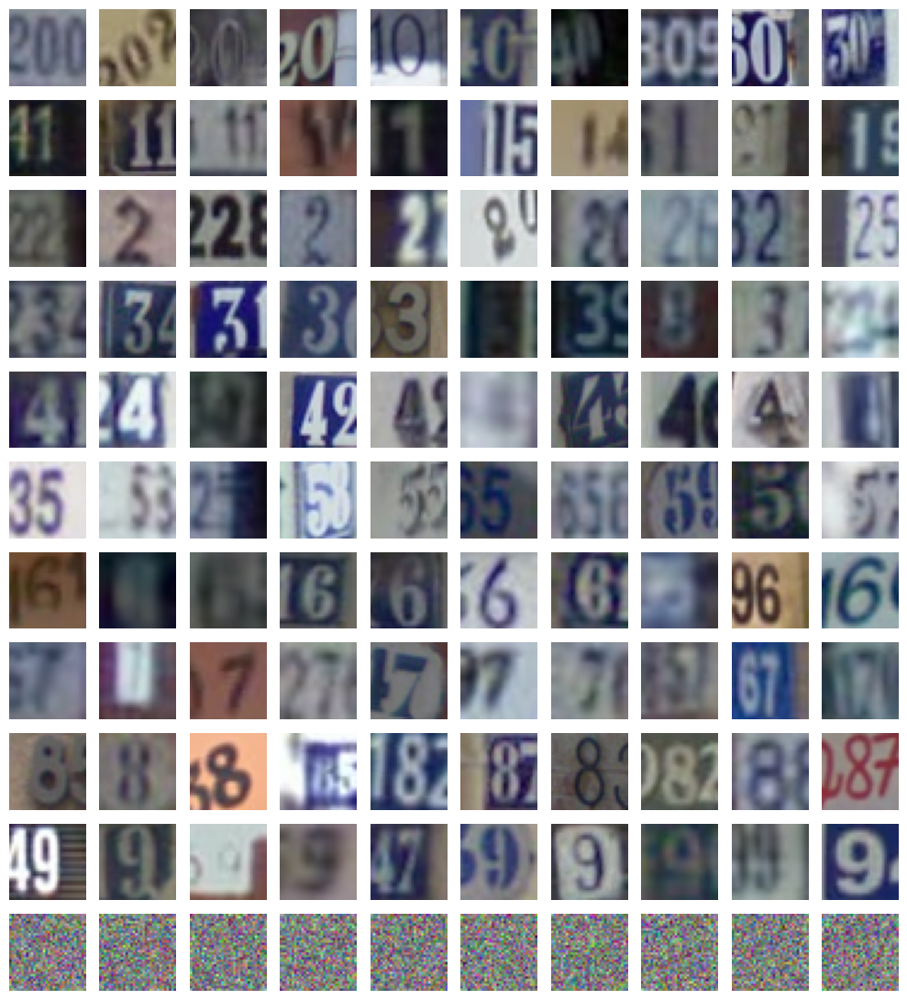

In [ ]:
class_images = {}

for class_name in sorted(os.listdir(train_pth)):
    class_pth = os.path.join(train_pth, class_name)

    if os.path.isdir(class_pth):
        class_images[class_name] = []

        for image_file in os.listdir(class_pth)[:10]:
            image_pth = os.path.join(class_pth, image_file)
            image = cv2.imread(image_pth, cv2.IMREAD_COLOR)     # read in color (BGR)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB
                class_images[class_name].append(image)

# Create subplot grid
fig, axs = plt.subplots(len(class_images), 10, figsize=(10, len(class_images)))

for i, (class_name, images) in enumerate(class_images.items()):
    for j in range(10):
        axs[i, j].imshow(images[j])  # already RGB
        axs[i, j].axis("off")

plt.tight_layout()
plt.show()

#### Classifier

##### 5 conv2d + 2 Linear

In [ ]:
class Classifier(nn.Module):
    def __init__(self, nc, ncf, n_classes=11):
        super().__init__()

        self.feature_extractor = nn.Sequential(
            # Layer 1:
            nn.Conv2d(nc, ncf, 4, 2, 1, bias=False),      # [B,nc,32,32] -> [B,ncf,16,16]
            nn.BatchNorm2d(ncf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),  # Dropout

            # Layer 2:
            nn.Conv2d(ncf, ncf, 3, 1, 1, bias=False),     # [B,ncf,16,16] -> [B,ncf,16,16]
            nn.BatchNorm2d(ncf),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 3
            nn.Conv2d(ncf, ncf*2, 4, 2, 1, bias=False),   # [B,ncf,16,16] -> [B,ncf*2,8,8]
            nn.BatchNorm2d(ncf*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),  # Increased dropout

            # Layer 4:
            nn.Conv2d(ncf*2, ncf*2, 3, 1, 1, bias=False), # [B,ncf*2,8,8] -> [B,ncf*2,8,8]
            nn.BatchNorm2d(ncf*2),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 5
            nn.Conv2d(ncf*2, ncf*4, 4, 2, 1, bias=False), # [B,ncf*2,8,8] -> [B,ncf*4,4,4]
            nn.BatchNorm2d(ncf*4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.4),  # Increased dropout

            nn.AdaptiveAvgPool2d(1),                      # [B,ncf*4,4,4] -> [B,ncf*4,1,1]
            nn.Flatten(),                                 # [B,ncf*4]
        )

        self.penultimate = nn.Sequential(
            nn.Linear(ncf*4, ncf*4),                      # [B, ncf*4] --> [B,ncf*4]
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.5),
        )

        self.classifier = nn.Linear(ncf*4, n_classes)     # [B,ncf*4] --> [B, n_classes]

    def forward(self, x):
        features = self.feature_extractor(x)
        penultimate_features = self.penultimate(features)
        logits = self.classifier(penultimate_features)
        return logits, penultimate_features

#### Generator

In [ ]:
class Generator(nn.Module):
  def __init__(self, n_classes, nz, ngf, nc):
    super().__init__()

    self.embed = nn.Linear(n_classes, nz)                      # [B,n_classes] --> [B,nz]

    self.main = nn.Sequential(
        nn.ConvTranspose2d(nz*2, ngf*8, 4,1,0,bias=False),     # [B,nz*2,1,1] --> [B,ngf*8,4,4]
        nn.BatchNorm2d(ngf*8),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*8, ngf*4, 4,2,1,bias=False),    # [B,ngf*8,4,4] --> [B,ngf*4,8,8]
        nn.BatchNorm2d(ngf*4),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*4, ngf*2, 4,2,1,bias=False),     # [B,ngf*4,8,8] --> [B,ngf*2,16,16]
        nn.BatchNorm2d(ngf*2),
        nn.LeakyReLU(0.2, inplace=True),

        nn.ConvTranspose2d(ngf*2, nc, 4,2,1, bias=False),       # [B,ngf*2,16,16] --> [B,nc,32,32]
        nn.Tanh()
    )

  def forward(self, latent_vec, cond_vec):
      embed_vec = self.embed(cond_vec).unsqueeze(-1).unsqueeze(-1)    #  [B,n_classes] --> [B,nz] --> [B,nz,1,1]
      input = torch.cat([latent_vec, embed_vec],1)   # [B,nz,1,1]+[B,nz,1,1]  dim=1 -->  [B,nz*2,1,1]
      return self.main(input)

#### Checking Classifier and Generator

In [ ]:
nz = 100
nc = 3
ncf = 32
ngf = 64
n_classes = 11
batch_size = 5

gen = Generator(n_classes, nz, ngf, nc).to(device)
csf = Classifier(nc, ncf).to(device)

latent_vec = torch.randn((batch_size, nz, 1, 1), device=device)
print("Latent_vector:", latent_vec.shape)

random_vec = torch.randn((batch_size, n_classes), device=device)
print("Random_vector:", random_vec.shape)

cond_vec = F.softmax(random_vec, dim=1)
print("cond_vector:", cond_vec.shape)

gen_image = gen(latent_vec, cond_vec)
print("Generated image shape:", gen_image.shape)

classifier_op, features = csf(gen_image)
print("Penultimate_Layer_features:", features.shape)
print("Classifier output:", classifier_op.shape)

Latent_vector: torch.Size([5, 100, 1, 1])
Random_vector: torch.Size([5, 11])
cond_vector: torch.Size([5, 11])
Generated image shape: torch.Size([5, 3, 32, 32])
Penultimate_Layer_features: torch.Size([5, 128])
Classifier output: torch.Size([5, 11])


#### Weights_initialization

In [ ]:
def weights_initialization_gen_xavier(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.xavier_normal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.xavier_normal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_ortho(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_normal(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.normal_(m.weight,mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.normal_(m.weight,mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_uniform(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.uniform_(m.weight, -0.08, 0.08)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.uniform_(m.weight,-0.08, 0.08)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_zero(m):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.constant_(m.weight,0)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,0)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.constant_(m.weight,0)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

def weights_initialization_gen_small(m,scale=1):
  if isinstance(m,nn.ConvTranspose2d) or isinstance(m,nn.Conv2d):
    nn.init.constant_(m.weight,scale)
    if m.bias is not None:
      nn.init.constant_(m.bias,scale)
  elif isinstance(m, nn.BatchNorm2d):
    nn.init.constant_(m.weight,scale)
    nn.init.constant_(m.bias,scale)
  elif isinstance(m,nn.Linear):
    nn.init.constant_(m.weight,scale)
    if m.bias is not None:
      nn.init.constant_(m.bias,scale)

def weights_initialization_gen_custom(m):
  if isinstance(m,nn.ConvTranspose2d):
    nn.init.normal_(m.weight, mean=0.0,std=0.02)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.BatchNorm2d):
    nn.init.constant_(m.weight,1)
    nn.init.constant_(m.bias,0)
  elif isinstance(m,nn.Linear):
    nn.init.orthogonal_(m.weight)
    if m.bias is not None:
      nn.init.constant_(m.bias,0)

In [ ]:
def gen_ordered_batch(n_classes, samples_per_class, nz, device=None):
    batch_size = n_classes * samples_per_class
    noise = torch.randn(batch_size, nz, 1, 1, device=device)
    labels = torch.arange(n_classes, device=device).repeat_interleave(samples_per_class)
    one_hot_labels = F.one_hot(labels, num_classes=n_classes).float().to(device)
    return noise, one_hot_labels

In [ ]:
noise, one_hot_labels = gen_ordered_batch(11,10,100)
noise.shape, one_hot_labels

(torch.Size([110, 100, 1, 1]),
 tensor([[1., 0., 0.,  ..., 0., 0., 0.],
         [1., 0., 0.,  ..., 0., 0., 0.],
         [1., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.]]))

#### Train

In [ ]:
def train(model, train_loader, optimizer, criterion, n_csf_epochs, device):

    for epoch in tqdm(range(n_csf_epochs), desc="Training", unit="epoch"):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            logits, features = model(images)
            loss  = criterion(logits, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            _, predicted = torch.max(logits.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        avg_loss = running_loss / len(train_loader)
        accuracy = correct / total

    return avg_loss, accuracy

#### Test

In [ ]:
def test(model, test_loader, criterion, device):

  model.eval()
  correct = 0
  total = 0
  running_loss = 0

  with torch.no_grad():

    pbar = tqdm(enumerate(test_loader), total=len(test_loader), desc="Testing")

    for i, (images, labels) in pbar:
      images, labels = images.to(device), labels.to(device)
      logits, features = model(images)
      loss = criterion(logits, labels)
      running_loss += loss.item()

      _,predicted = torch.max(logits.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

      pbar.set_postfix({"Batch Loss": loss.item()})

  avg_loss = running_loss / len(test_loader)
  accuracy = correct / total

  return avg_loss, accuracy

#### Class weights

In [ ]:
def cal_class_weights(dataset):

  targets = [target for _,target in dataset.samples]
  targets_tensor = torch.tensor(targets)

  class_counts = torch.bincount(targets_tensor)
  total_samples = len(dataset)

  class_weights = total_samples/(class_counts*len(class_counts))

  return class_weights

In [ ]:
train_label_tensor = torch.tensor([label for _,label in train_dataset.samples])
train_label_tensor

tensor([ 0,  0,  0,  ..., 10, 10, 10])

In [ ]:
torch.bincount(train_label_tensor)

tensor([ 4948, 13861, 10585,  8497,  7458,  6882,  5727,  5595,  5045,  4659,
         7325])

In [ ]:
cal_class_weights(train_dataset)

tensor([1.4805, 0.5285, 0.6921, 0.8621, 0.9823, 1.0645, 1.2791, 1.3093, 1.4521,
        1.5724, 1.0001])

#### Inversion Loss functions

In [ ]:
def kl_divergence(p, q, eps=1e-8):
    p = p.clamp(min=eps, max=1.0)
    q = q.clamp(min=eps, max=1.0)
    kl_div = F.kl_div(p.log(), q, reduction='batchmean')
    return kl_div

def cross_entropy(logits, set_labels):
  ce_loss = F.cross_entropy(logits, set_labels)
  return ce_loss

In [ ]:
def cosine_similarity(features, eps=1e-8):
    normalized_features = F.normalize(features, p=2, dim=1, eps=eps)
    similarity_matrix = torch.mm(normalized_features, normalized_features.t())
    mask = torch.eye(similarity_matrix.size(0), device=similarity_matrix.device).bool()
    similarity_matrix = similarity_matrix.masked_fill(mask, 0)
    cos_loss = similarity_matrix.sum() / (features.size(0) * (features.size(0) - 1))
    return cos_loss

# def feature_orthogonality(features):
#     features = F.normalize(features, p=2, dim=1, eps=1e-8)
#     gram_matrix = torch.mm(features, features.t())
#     identity_matrix = torch.eye(gram_matrix.size(0), device=gram_matrix.device)
#     ortho_loss = torch.mean((gram_matrix - identity_matrix) ** 2)
#     return ortho_loss

In [ ]:
def compute_inversion_loss(gen_imgs, set_labels, input_pdf, logits, features, alpha, beta, gamma, delta):

    # logits, features = csf(gen_imgs)
    # logits = logits[:,:10]
    kl_loss    = kl_divergence(logits, input_pdf)
    ce_loss    = cross_entropy(logits, set_labels)
    cos_loss   = cosine_similarity(features)
    # ortho_loss = feature_orthogonality(features)

    inversion_loss = (alpha * kl_loss) + (beta * ce_loss) + (gamma * cos_loss)
    # + (delta * ortho_loss)
    return inversion_loss, alpha * kl_loss, beta * ce_loss, gamma * cos_loss
    # , delta * ortho_loss

#### Metrics

In [ ]:
def compute_metrics(logits):

  # Confidence
    p = F.softmax(logits, dim=1)
    confidence, _ = torch.max(p, dim=1)

  # Margin
    top2_conf, _ = torch.topk(p, 2, dim=1)
    margin = top2_conf[:, 0] - top2_conf[:, 1]

  # Uncertainty_estimate
    k = logits.size(1)
    u = torch.full_like(p, 1.0 / k)    # [B,k]
    a = ((p - u)**2).sum(dim=1)        # shape: [B]
    delta = F.one_hot(p.argmax(dim=1), num_classes= k).float()
    b = ((delta - u) ** 2).sum(dim=1)  # shape: [B]
    ue = 1 - (a/b)

  # Entropy
    log_softmax = torch.log(p + 1e-10)
    entropy = -torch.sum(p * log_softmax, dim=1)

    return confidence, margin, ue, entropy

#### Inversion

In [ ]:
def freeze(model):
    for param in model.parameters():
        param.requires_grad = False

def unfreeze(model):
    for param in model.parameters():
        param.requires_grad = True

In [ ]:
def inversion(epoch, nz, n_gen_classes, samples_per_class,
              gen, csf, num_steps, gen_imgs_per_step,
              gen_optimizer,alpha, beta, gamma, delta,
              visualization_dir, ood_save_dir, metrics_storage,
              device):

  gen.train()
  csf.eval()
  freeze(csf)

  ibar = tqdm(range(num_steps), desc = f"Inversion")

  for step in ibar:

    gen_optimizer.zero_grad()

    noise = torch.randn(gen_imgs_per_step, nz, 1, 1, device=device)
    input_pdf = F.softmax(torch.randn(gen_imgs_per_step, n_gen_classes, device=device), dim = 1)
    set_labels = torch.argmax(input_pdf, dim=1)

    gen_imgs = gen(noise, input_pdf)

    logits, features = csf(gen_imgs)
    # logits = logits[:, :10]

    inversion_loss, kl_loss, ce_loss, cos_loss= compute_inversion_loss(
                                                              gen_imgs, set_labels, input_pdf, logits, features,
                                                              alpha, beta, gamma, delta)
    inversion_loss.backward()
    gen_optimizer.step()


    ibar.set_postfix({"Inversion Loss": inversion_loss.item()})

  with torch.no_grad():

    _ , predicted = torch.max(logits, 1)
    inversion_accuracy = (predicted == set_labels).float().mean().item()

    fixed_noise , fixed_pdf = gen_ordered_batch(
        n_gen_classes, samples_per_class, nz, device)

    class_imgs = gen(fixed_noise, fixed_pdf)

    conf_mean = []
    ue_mean   = []
    entropy_mean  = []
    margin_mean =  []

    for class_idx in range(n_gen_classes):

      start_idx = class_idx * samples_per_class
      end_idx   = start_idx + samples_per_class
      class_samples = class_imgs[start_idx:end_idx]
      logits, features = csf(class_samples)
      # logits = logits[:, :10]

      conf,  margin, ue, entropy = compute_metrics(logits)

      conf_val     = round(conf.mean().item(), 4)
      margin_val   = round(margin.mean().item(), 4)
      ue_val       = round(ue.mean().item(), 4)
      entropy_val  = round(entropy.mean().item(), 4)

      conf_mean.append(conf_val)
      margin_mean.append(margin_val)
      ue_mean.append(ue_val)
      entropy_mean.append(entropy_val)


      vutils.save_image(
          class_samples[0].detach().cpu(),
          os.path.join(
              visualization_dir,
              f"class_{class_idx}_epoch_{epoch+1:03d}_ue_{ue_val:.4f}.png"
          ),
          normalize=True,
      )


    metrics_storage[epoch] = {
        "conf_mean"   : conf_mean,
        "margin_mean" : margin_mean,
        "ue_mean"     : ue_mean,
        "entropy_mean": entropy_mean}

    print(f"\n Confidence : {conf_mean}")
    print(f"   Margin   : {margin_mean}")
    print(f"     UE     : {ue_mean}")
    print(f"   Entropy  : {entropy_mean}\n")

    avg_conf = sum(conf_mean) / len(conf_mean)
    avg_margin = sum(margin_mean) / len(margin_mean)
    avg_ue = sum(ue_mean) / len(ue_mean)
    avg_entropy = sum(entropy_mean) / len(entropy_mean)

    print(f"Avg_Confidence : {avg_conf:.4f}")
    print(f"Avg_Margin     : {avg_margin:.4f}")
    print(f"Avg_UE         : {avg_ue:.4f}")
    print(f"Avg_Entropy    : {avg_entropy:.4f}\n")


    for i, image in enumerate(gen_imgs):
      vutils.save_image(
          image.detach().cpu(),
          os.path.join(ood_save_dir, f"epoch_{epoch+1:03d}_sample_{i:04d}.png"),
          normalize=True
      )

  unfreeze(csf)
  return inversion_loss.item(), kl_loss.item(), ce_loss.item(), cos_loss.item(), inversion_accuracy

#### Main_pipeline

In [ ]:
def main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch=None):

    os.makedirs(saved_model_dir, exist_ok=True)
    os.makedirs(visualization_dir, exist_ok=True)

    metrics_storage = {}
    best_test_accuracy = 0
    best_epoch = 0
    start_epoch = 1

    if resume_epoch is not None:
        checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_epoch_{resume_epoch-1}.pt")
        print(f"Loading checkpoint from {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path)

        csf.load_state_dict(checkpoint['csf_state_dict'])
        gen.load_state_dict(checkpoint['gen_state_dict'])
        csf_optimizer.load_state_dict(checkpoint['csf_optimizer_state_dict'])
        gen_optimizer.load_state_dict(checkpoint['gen_optimizer_state_dict'])
        best_test_accuracy = checkpoint['best_test_accuracy']
        best_epoch = checkpoint['best_epoch']
        metrics_storage = checkpoint['metrics_storage']
        start_epoch = resume_epoch

        print(f"Resumed from epoch {resume_epoch}. Best test acc: {best_test_accuracy:.4f} at epoch {best_epoch}")


    # Reload the dataset at start
    train_dataset = ImageFolder(root=train_pth, transform= svhn_transform)
    train_loader  = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


    for epoch in range(start_epoch-1, num_epochs):
        print(f"\n------------------Epoch {epoch+1}----------------------")
        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"Train dataset size at epoch start: {len(train_dataset)}")

        inversion_loss, kl_loss, ce_loss, cos_loss, inversion_accuracy = inversion(epoch, nz, n_gen_classes,
                samples_per_class, gen, csf, num_steps, gen_imgs_per_step,
                gen_optimizer,  alpha, beta, gamma, delta,
                visualization_dir, ood_save_dir, metrics_storage,device)

        # inversion_loss, kl_loss, ce_loss, cos_loss, ortho_loss, inversion_accuracy = inversion(epoch, nz, n_gen_classes,
        #         samples_per_class, gen, csf, num_steps, gen_imgs_per_step,
        #         gen_optimizer,  alpha, beta, gamma, delta,
        #         visualization_dir, ood_save_dir, metrics_storage,device)

        print(f"Inversion Loss: {inversion_loss:.4f}, Inversion Accuracy: {inversion_accuracy:.4f}")
        print(f"Inversion Losses : kl_loss: {kl_loss:.4f}, ce_loss: {ce_loss:.4f}, cos_loss: {cos_loss:.4f}")
        # print(f"Inversion Losses : kl_loss: {kl_loss:.4f}, ce_loss: {ce_loss:.4f}, cos_loss: {cos_loss:.4f}, ortho_loss: {ortho_loss:.4f}")

        train_dataset = ImageFolder(root = train_pth, transform= svhn_transform)

        # Count OOD files after inversion
        ood_files = glob.glob(os.path.join(ood_save_dir, "**", "*.*"), recursive=True)
        print(f"Garbage directory size after inversion: {len(ood_files)} files")
        print(f"Train dataset size after inversion: {len(train_dataset)}\n")


        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        class_weights = cal_class_weights(train_dataset).to(device)
        csf_criterion = nn.CrossEntropyLoss(weight=class_weights)

        train_loss, train_accuracy = train(csf, train_loader, csf_optimizer, csf_criterion, n_csf_epochs, device)
        test_loss, test_accuracy = test(csf, test_loader, csf_criterion, device)

        print(f"\nTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"Test Loss   : {test_loss:.4f},  Test Accuracy : {test_accuracy:.4f}")


        np.save(os.path.join(saved_model_dir, "metrics_storage.npy"), metrics_storage)


        if test_accuracy > best_test_accuracy:
            best_test_accuracy = test_accuracy
            best_epoch = epoch + 1
            torch.save(csf.state_dict(), f'{saved_model_dir}/csf_model.pth')
            print(f"\nNew best test accuracy: {best_test_accuracy:.4f} at epoch {best_epoch}. Model with best test accuracy is saved.")


        checkpoint = {
            'epoch': epoch+1,
            'csf_state_dict': csf.state_dict(),
            'gen_state_dict': gen.state_dict(),
            'csf_optimizer_state_dict': csf_optimizer.state_dict(),
            'gen_optimizer_state_dict': gen_optimizer.state_dict(),
            'best_test_accuracy': best_test_accuracy,
            'best_epoch': best_epoch,
            'metrics_storage': metrics_storage,
        }
        checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_epoch_{epoch+1}.pt")
        torch.save(checkpoint, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

    print(f"\nBest Test Accuracy: {best_test_accuracy:.4f} at Epoch {best_epoch}")

#### Training

In [ ]:
# folder_path = "./drive/MyDrive/svhn/EXP_1/model"
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Deleted folder: ./drive/MyDrive/svhn/EXP_1/model


In [ ]:
# folder_path = "./drive/MyDrive/svhn/EXP_1/visualization"

# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Deleted folder: ./drive/MyDrive/svhn/EXP_1/visualization


In [ ]:
garbage_dir    = os.path.join(train_pth, "garbage")
mydrive_svhn  = "./drive/MyDrive/svhn"
os.makedirs(mydrive_svhn, exist_ok=True)

In [ ]:
experiment_no = 3

In [ ]:
saved_model_dir   = os.path.join(mydrive_svhn,f"EXP_{experiment_no}/model")
visualization_dir = os.path.join(mydrive_svhn,f"EXP_{experiment_no}/visualization")
ood_save_dir      = garbage_dir

os.makedirs(saved_model_dir, exist_ok=True)
os.makedirs(visualization_dir, exist_ok=True)

In [ ]:
saved_model_dir

'./drive/MyDrive/svhn/EXP_3/model'

In [ ]:
visualization_dir

'./drive/MyDrive/svhn/EXP_3/visualization'

In [ ]:
nc = 3
n_gen_classes = 11
samples_per_class = 10
batch_size = 32

#-------------
## Hyperparameters to tweak
nz = 100
ncf = 32
ngf = 64
#------------

csf = Classifier(nc, ncf).to(device)

gen = Generator(n_gen_classes, nz, ngf, nc).to(device)
gen.apply(weights_initialization_gen_normal)

gen_optimizer = optim.Adam(gen.parameters(), lr=0.001)
csf_optimizer = optim.Adam(csf.parameters(), lr=0.0001)

# gen_optimizer = optim.Adam(gen.parameters(), lr=0.0002, betas=(0.5, 0.999))
# csf_optimizer = optim.Adam(csf.parameters(), lr=0.00005, betas=(0.5, 0.999))

In [ ]:
n_csf_epochs = 1

In [ ]:
initial_class_weights = cal_class_weights(train_dataset).to(device)
csf_criterion = nn.CrossEntropyLoss(weight=initial_class_weights)
train_loss, train_accuracy = train(csf, train_loader, csf_optimizer, csf_criterion, n_csf_epochs, device)
print(f"\nTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

Training: 100%|██████████| 1/1 [01:02<00:00, 62.79s/epoch]


Train Loss: 1.8711, Train Accuracy: 0.3444


In [ ]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(csf,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 814/814 [00:14<00:00, 56.56it/s, Batch Loss=2.15]


Test Loss:1.3448,  Test Accuracy: 0.5526


In [ ]:
# Create a model directory
model_dir = saved_model_dir

# Save model state_dict + other important info
checkpoint = {
    'model_state_dict': csf.state_dict(),
    'optimizer_state_dict': csf_optimizer.state_dict(),
    'train_accuracy': train_accuracy,
    'test_accuracy': test_accuracy,
    'train_loss': train_loss,
    'test_loss': test_loss,
}

# Save to intial model(before inversion) at "checkpoint_csf_initial.pt"
checkpoint_path = os.path.join(saved_model_dir, f"checkpoint_csf_initial.pt")
torch.save(checkpoint, checkpoint_path)
print(f"Checkpoint saved at {checkpoint_path}")

Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_csf_initial.pt


In [ ]:
# Hyperparameters for the inversion loss components
alpha = 0       # Weight for KL divergence loss
beta  = 1       # Weight for cross-entropy loss
gamma = 100     # Weight for cosine similarity loss
delta = 0       # Weight for feature orthogonality loss

num_steps         = 100
gen_imgs_per_step = 11000

In [ ]:
n_csf_epochs = 1
num_epochs   = 3

In [ ]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch=None)


------------------Epoch 1----------------------
Epoch 1/3
Train dataset size at epoch start: 80582


Inversion: 100%|██████████| 100/100 [04:16<00:00,  2.57s/it, Inversion Loss=22.8]



 Confidence : [0.2649, 0.2541, 0.3069, 0.3162, 0.2605, 0.3248, 0.4646, 0.341, 0.2663, 0.3498, 0.4032]
   Margin   : [0.0903, 0.1186, 0.1921, 0.2001, 0.0962, 0.1946, 0.319, 0.2058, 0.1688, 0.2339, 0.2912]
     UE     : [0.8939, 0.9044, 0.8805, 0.8671, 0.8859, 0.8745, 0.7652, 0.8513, 0.9159, 0.8432, 0.8109]
   Entropy  : [1.9704, 2.0649, 2.0357, 1.9899, 1.9856, 1.9774, 1.6393, 1.9254, 2.1493, 1.9103, 1.8479]

Avg_Confidence : 0.3229
Avg_Margin     : 0.1919
Avg_UE         : 0.8630
Avg_Entropy    : 1.9542

Inversion Loss: 22.7509, Inversion Accuracy: 0.1007
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.9878, cos_loss: 19.7631
Garbage directory size after inversion: 18325 files
Train dataset size after inversion: 91582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.92it/s, Batch Loss=1.22]



Train Loss: 1.1584, Train Accuracy: 0.6739
Test Loss   : 0.8089,  Test Accuracy : 0.7592

New best test accuracy: 0.7592 at epoch 1. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_1.pt

------------------Epoch 2----------------------
Epoch 2/3
Train dataset size at epoch start: 91582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.58s/it, Inversion Loss=18.4]



 Confidence : [0.2695, 0.2221, 0.1735, 0.2305, 0.2329, 0.2016, 0.2305, 0.2974, 0.2271, 0.2159, 0.2774]
   Margin   : [0.0702, 0.0429, 0.0304, 0.0752, 0.055, 0.0441, 0.0603, 0.0705, 0.0436, 0.0366, 0.0352]
     UE     : [0.9077, 0.9353, 0.9622, 0.9447, 0.9281, 0.9527, 0.9393, 0.8762, 0.9267, 0.9306, 0.877]
   Entropy  : [2.0302, 2.1096, 2.2467, 2.1716, 2.1164, 2.1976, 2.1314, 1.9123, 2.1006, 2.1245, 1.8806]

Avg_Confidence : 0.2344
Avg_Margin     : 0.0513
Avg_UE         : 0.9255
Avg_Entropy    : 2.0929

Inversion Loss: 18.3698, Inversion Accuracy: 0.0932
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.7346, cos_loss: 15.6352
Garbage directory size after inversion: 29325 files
Train dataset size after inversion: 102582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.94it/s, Batch Loss=0.854]



Train Loss: 0.8212, Train Accuracy: 0.7996
Test Loss   : 0.5813,  Test Accuracy : 0.8267

New best test accuracy: 0.8267 at epoch 2. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_2.pt

------------------Epoch 3----------------------
Epoch 3/3
Train dataset size at epoch start: 102582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.57s/it, Inversion Loss=15.8]



 Confidence : [0.2592, 0.4349, 0.2904, 0.25, 0.3579, 0.2566, 0.2393, 0.2732, 0.358, 0.2169, 0.5444]
   Margin   : [0.0572, 0.2579, 0.1037, 0.0784, 0.1614, 0.1017, 0.0837, 0.111, 0.1573, 0.0351, 0.4231]
     UE     : [0.8989, 0.7829, 0.8829, 0.9168, 0.8342, 0.9057, 0.9213, 0.9118, 0.8303, 0.9269, 0.6381]
   Entropy  : [1.9352, 1.6506, 1.9651, 2.0635, 1.7643, 2.0686, 2.0466, 2.0244, 1.7619, 2.0322, 1.4079]

Avg_Confidence : 0.3164
Avg_Margin     : 0.1428
Avg_UE         : 0.8591
Avg_Entropy    : 1.8837

Inversion Loss: 15.8476, Inversion Accuracy: 0.1161
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.9451, cos_loss: 12.9025
Garbage directory size after inversion: 40325 files
Train dataset size after inversion: 113582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.64it/s, Batch Loss=0.636]



Train Loss: 0.6607, Train Accuracy: 0.8560
Test Loss   : 0.4823,  Test Accuracy : 0.8551

New best test accuracy: 0.8551 at epoch 3. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_3.pt

Best Test Accuracy: 0.8551 at Epoch 3


In [ ]:
resume_epoch = 4
num_epochs   = 20

In [ ]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch)

Loading checkpoint from ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_3.pt
Resumed from epoch 4. Best test acc: 0.8551 at epoch 3

------------------Epoch 4----------------------
Epoch 4/20
Train dataset size at epoch start: 113582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.58s/it, Inversion Loss=17.9]



 Confidence : [0.3807, 0.2846, 0.4239, 0.2624, 0.2664, 0.4616, 0.3701, 0.3469, 0.4027, 0.3223, 0.2811]
   Margin   : [0.1906, 0.1164, 0.2492, 0.0984, 0.0879, 0.2922, 0.2017, 0.1576, 0.2099, 0.1238, 0.1052]
     UE     : [0.8341, 0.8908, 0.8135, 0.9109, 0.9111, 0.7912, 0.8352, 0.8402, 0.8242, 0.8692, 0.8976]
   Entropy  : [1.7878, 1.9809, 1.7213, 2.0295, 2.031, 1.6794, 1.8324, 1.786, 1.7505, 1.8751, 2.0108]

Avg_Confidence : 0.3457
Avg_Margin     : 0.1666
Avg_UE         : 0.8562
Avg_Entropy    : 1.8622

Inversion Loss: 17.9040, Inversion Accuracy: 0.0897
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.1210, cos_loss: 14.7830
Garbage directory size after inversion: 51325 files
Train dataset size after inversion: 124582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.14it/s, Batch Loss=0.355]



Train Loss: 0.5766, Train Accuracy: 0.8856
Test Loss   : 0.4435,  Test Accuracy : 0.8697

New best test accuracy: 0.8697 at epoch 4. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_4.pt

------------------Epoch 5----------------------
Epoch 5/20
Train dataset size at epoch start: 124582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.58s/it, Inversion Loss=17.9]



 Confidence : [0.3112, 0.3235, 0.3592, 0.3214, 0.3441, 0.4159, 0.3343, 0.2363, 0.2962, 0.3161, 0.3204]
   Margin   : [0.1334, 0.1541, 0.207, 0.1331, 0.1774, 0.2429, 0.1171, 0.0612, 0.1072, 0.1131, 0.1492]
     UE     : [0.8954, 0.8784, 0.8376, 0.8762, 0.8629, 0.7985, 0.8651, 0.9308, 0.8912, 0.8674, 0.8839]
   Entropy  : [1.99, 1.9479, 1.8642, 1.9083, 1.903, 1.6959, 1.8777, 2.0926, 1.9568, 1.8502, 1.9422]

Avg_Confidence : 0.3253
Avg_Margin     : 0.1451
Avg_UE         : 0.8716
Avg_Entropy    : 1.9117

Inversion Loss: 17.8777, Inversion Accuracy: 0.1029
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.9585, cos_loss: 14.9192
Garbage directory size after inversion: 62325 files
Train dataset size after inversion: 135582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.86it/s, Batch Loss=0.256]



Train Loss: 0.5198, Train Accuracy: 0.9051
Test Loss   : 0.4198,  Test Accuracy : 0.8757

New best test accuracy: 0.8757 at epoch 5. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_5.pt

------------------Epoch 6----------------------
Epoch 6/20
Train dataset size at epoch start: 135582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=15.5]



 Confidence : [0.2912, 0.2556, 0.3422, 0.4104, 0.2294, 0.3508, 0.3029, 0.3084, 0.3949, 0.3332, 0.2681]
   Margin   : [0.1095, 0.0813, 0.1475, 0.2483, 0.072, 0.1572, 0.1026, 0.1006, 0.1992, 0.14, 0.0855]
     UE     : [0.9013, 0.9227, 0.8633, 0.8098, 0.9426, 0.8652, 0.8909, 0.8839, 0.8209, 0.8607, 0.9088]
   Entropy  : [1.9846, 2.0579, 1.8775, 1.7702, 2.1515, 1.8768, 1.9626, 1.9091, 1.7667, 1.8787, 2.0221]

Avg_Confidence : 0.3170
Avg_Margin     : 0.1312
Avg_UE         : 0.8791
Avg_Entropy    : 1.9325

Inversion Loss: 15.5357, Inversion Accuracy: 0.0943
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.9683, cos_loss: 12.5674
Garbage directory size after inversion: 73325 files
Train dataset size after inversion: 146582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.26it/s, Batch Loss=0.313]



Train Loss: 0.4753, Train Accuracy: 0.9199
Test Loss   : 0.3926,  Test Accuracy : 0.8851

New best test accuracy: 0.8851 at epoch 6. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_6.pt

------------------Epoch 7----------------------
Epoch 7/20
Train dataset size at epoch start: 146582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=13.6]



 Confidence : [0.2667, 0.2623, 0.4446, 0.4847, 0.3712, 0.3483, 0.4527, 0.4058, 0.3123, 0.4331, 0.3035]
   Margin   : [0.084, 0.0824, 0.3054, 0.3198, 0.1624, 0.1741, 0.2897, 0.2114, 0.1414, 0.2341, 0.0976]
     UE     : [0.9007, 0.9175, 0.7384, 0.6905, 0.8221, 0.8292, 0.7587, 0.7836, 0.8439, 0.738, 0.8542]
   Entropy  : [1.9936, 2.048, 1.6246, 1.4955, 1.7471, 1.8331, 1.6435, 1.6167, 1.8935, 1.5612, 1.8194]

Avg_Confidence : 0.3714
Avg_Margin     : 0.1911
Avg_UE         : 0.8070
Avg_Entropy    : 1.7524

Inversion Loss: 13.5669, Inversion Accuracy: 0.0979
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.0891, cos_loss: 10.4779
Garbage directory size after inversion: 84325 files
Train dataset size after inversion: 157582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.49it/s, Batch Loss=0.34]



Train Loss: 0.4442, Train Accuracy: 0.9300
Test Loss   : 0.3747,  Test Accuracy : 0.8875

New best test accuracy: 0.8875 at epoch 7. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_7.pt

------------------Epoch 8----------------------
Epoch 8/20
Train dataset size at epoch start: 157582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=11]



 Confidence : [0.3956, 0.4515, 0.3893, 0.3296, 0.3406, 0.4966, 0.3806, 0.2371, 0.3939, 0.5415, 0.2806]
   Margin   : [0.1778, 0.2276, 0.2132, 0.1894, 0.1866, 0.327, 0.1748, 0.0425, 0.1913, 0.3696, 0.1187]
     UE     : [0.7812, 0.7517, 0.827, 0.8424, 0.8308, 0.7272, 0.8068, 0.9203, 0.7882, 0.6973, 0.8843]
   Entropy  : [1.6392, 1.5045, 1.78, 1.8952, 1.8721, 1.5318, 1.7444, 2.0584, 1.6745, 1.4361, 1.9667]

Avg_Confidence : 0.3852
Avg_Margin     : 0.2017
Avg_UE         : 0.8052
Avg_Entropy    : 1.7366

Inversion Loss: 10.9658, Inversion Accuracy: 0.1035
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.1757, cos_loss: 7.7901
Garbage directory size after inversion: 95325 files
Train dataset size after inversion: 168582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.48it/s, Batch Loss=0.38]



Train Loss: 0.4216, Train Accuracy: 0.9390
Test Loss   : 0.3362,  Test Accuracy : 0.9003

New best test accuracy: 0.9003 at epoch 8. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_8.pt

------------------Epoch 9----------------------
Epoch 9/20
Train dataset size at epoch start: 168582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=11.5]



 Confidence : [0.2879, 0.483, 0.4228, 0.3555, 0.4353, 0.3587, 0.3902, 0.4948, 0.3995, 0.4163, 0.4534]
   Margin   : [0.1219, 0.331, 0.2854, 0.2113, 0.3244, 0.1975, 0.2248, 0.3308, 0.2303, 0.2485, 0.2945]
     UE     : [0.8776, 0.7246, 0.7883, 0.8166, 0.7667, 0.84, 0.7858, 0.716, 0.7891, 0.8003, 0.7313]
   Entropy  : [1.9626, 1.534, 1.7278, 1.8232, 1.724, 1.837, 1.7119, 1.4964, 1.7267, 1.6838, 1.5707]

Avg_Confidence : 0.4089
Avg_Margin     : 0.2546
Avg_UE         : 0.7851
Avg_Entropy    : 1.7089

Inversion Loss: 11.4504, Inversion Accuracy: 0.1179
Inversion Losses : kl_loss: 0.0000, ce_loss: 3.0216, cos_loss: 8.4288
Garbage directory size after inversion: 106325 files
Train dataset size after inversion: 179582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.93it/s, Batch Loss=0.392]



Train Loss: 0.4011, Train Accuracy: 0.9449
Test Loss   : 0.3359,  Test Accuracy : 0.9022

New best test accuracy: 0.9022 at epoch 9. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_9.pt

------------------Epoch 10----------------------
Epoch 10/20
Train dataset size at epoch start: 179582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=8.24]



 Confidence : [0.4995, 0.4868, 0.5096, 0.499, 0.4154, 0.3414, 0.2858, 0.3698, 0.4702, 0.3576, 0.3699]
   Margin   : [0.3315, 0.3298, 0.3027, 0.2945, 0.2206, 0.1585, 0.1092, 0.217, 0.3182, 0.1279, 0.1748]
     UE     : [0.7017, 0.6884, 0.6866, 0.7069, 0.7773, 0.8373, 0.8834, 0.7975, 0.7148, 0.8252, 0.8158]
   Entropy  : [1.4852, 1.4708, 1.3617, 1.3981, 1.6321, 1.814, 1.9331, 1.781, 1.5255, 1.6696, 1.7513]

Avg_Confidence : 0.4186
Avg_Margin     : 0.2350
Avg_UE         : 0.7668
Avg_Entropy    : 1.6202

Inversion Loss: 8.2418, Inversion Accuracy: 0.1174
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.8753, cos_loss: 5.3665
Garbage directory size after inversion: 117325 files
Train dataset size after inversion: 190582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.41it/s, Batch Loss=0.337]



Train Loss: 0.3810, Train Accuracy: 0.9506
Test Loss   : 0.3247,  Test Accuracy : 0.9067

New best test accuracy: 0.9067 at epoch 10. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_10.pt

------------------Epoch 11----------------------
Epoch 11/20
Train dataset size at epoch start: 190582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=7.06]



 Confidence : [0.3635, 0.358, 0.3861, 0.3677, 0.3626, 0.4448, 0.3857, 0.4452, 0.5089, 0.4227, 0.3047]
   Margin   : [0.1808, 0.1217, 0.1863, 0.18, 0.2014, 0.2092, 0.2315, 0.1885, 0.3256, 0.2417, 0.118]
     UE     : [0.8185, 0.8211, 0.8208, 0.8438, 0.8349, 0.7586, 0.7953, 0.7344, 0.6895, 0.8027, 0.8506]
   Entropy  : [1.7479, 1.646, 1.6946, 1.792, 1.8307, 1.4817, 1.709, 1.4496, 1.4262, 1.6976, 1.7988]

Avg_Confidence : 0.3954
Avg_Margin     : 0.1986
Avg_UE         : 0.7973
Avg_Entropy    : 1.6613

Inversion Loss: 7.0600, Inversion Accuracy: 0.1423
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.8701, cos_loss: 4.1899
Garbage directory size after inversion: 128325 files
Train dataset size after inversion: 201582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.46it/s, Batch Loss=0.297]



Train Loss: 0.3681, Train Accuracy: 0.9545
Test Loss   : 0.3191,  Test Accuracy : 0.9078

New best test accuracy: 0.9078 at epoch 11. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_11.pt

------------------Epoch 12----------------------
Epoch 12/20
Train dataset size at epoch start: 201582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=7.12]



 Confidence : [0.5241, 0.4614, 0.5504, 0.4098, 0.4832, 0.3787, 0.452, 0.5615, 0.5531, 0.4568, 0.4408]
   Margin   : [0.3458, 0.3148, 0.3962, 0.2624, 0.3421, 0.1485, 0.2666, 0.4251, 0.3873, 0.2745, 0.3039]
     UE     : [0.626, 0.71, 0.6699, 0.7718, 0.7132, 0.8145, 0.7353, 0.6018, 0.6729, 0.7602, 0.7298]
   Entropy  : [1.2921, 1.5521, 1.4104, 1.7151, 1.5605, 1.6871, 1.5757, 1.306, 1.3951, 1.5839, 1.6431]

Avg_Confidence : 0.4793
Avg_Margin     : 0.3152
Avg_UE         : 0.7096
Avg_Entropy    : 1.5201

Inversion Loss: 7.1206, Inversion Accuracy: 0.1452
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.9437, cos_loss: 4.1769
Garbage directory size after inversion: 139325 files
Train dataset size after inversion: 212582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.47it/s, Batch Loss=0.361]



Train Loss: 0.3521, Train Accuracy: 0.9585
Test Loss   : 0.3118,  Test Accuracy : 0.9088

New best test accuracy: 0.9088 at epoch 12. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_12.pt

------------------Epoch 13----------------------
Epoch 13/20
Train dataset size at epoch start: 212582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=5.84]



 Confidence : [0.3661, 0.4784, 0.5084, 0.4858, 0.6265, 0.4998, 0.3726, 0.4622, 0.4807, 0.6605, 0.5188]
   Margin   : [0.1083, 0.1707, 0.3556, 0.356, 0.5055, 0.3209, 0.1505, 0.2699, 0.3243, 0.5476, 0.2737]
     UE     : [0.8082, 0.6918, 0.7066, 0.7119, 0.5669, 0.7059, 0.8105, 0.724, 0.7539, 0.5396, 0.6573]
   Entropy  : [1.6474, 1.2789, 1.518, 1.5632, 1.2171, 1.4708, 1.6834, 1.4907, 1.6086, 1.1377, 1.245]

Avg_Confidence : 0.4963
Avg_Margin     : 0.3075
Avg_UE         : 0.6979
Avg_Entropy    : 1.4419

Inversion Loss: 5.8421, Inversion Accuracy: 0.1614
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.7900, cos_loss: 3.0521
Garbage directory size after inversion: 150325 files
Train dataset size after inversion: 223582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.84it/s, Batch Loss=0.468]



Train Loss: 0.3435, Train Accuracy: 0.9615
Test Loss   : 0.2831,  Test Accuracy : 0.9188

New best test accuracy: 0.9188 at epoch 13. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_13.pt

------------------Epoch 14----------------------
Epoch 14/20
Train dataset size at epoch start: 223582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=5.45]



 Confidence : [0.3687, 0.6536, 0.7355, 0.4875, 0.6481, 0.4581, 0.3803, 0.353, 0.3856, 0.5429, 0.3914]
   Margin   : [0.1893, 0.4975, 0.6448, 0.3012, 0.5031, 0.26, 0.243, 0.1966, 0.1787, 0.429, 0.1968]
     UE     : [0.7824, 0.5241, 0.3777, 0.7243, 0.4905, 0.7574, 0.7855, 0.8458, 0.7975, 0.6097, 0.7989]
   Entropy  : [1.6537, 1.076, 0.8152, 1.4823, 1.0391, 1.5513, 1.7681, 1.8223, 1.7044, 1.3492, 1.6565]

Avg_Confidence : 0.4913
Avg_Margin     : 0.3309
Avg_UE         : 0.6813
Avg_Entropy    : 1.4471

Inversion Loss: 5.4472, Inversion Accuracy: 0.1657
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.6766, cos_loss: 2.7706
Garbage directory size after inversion: 161325 files
Train dataset size after inversion: 234582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.35it/s, Batch Loss=0.215]



Train Loss: 0.3337, Train Accuracy: 0.9642
Test Loss   : 0.2956,  Test Accuracy : 0.9153
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_14.pt

------------------Epoch 15----------------------
Epoch 15/20
Train dataset size at epoch start: 234582


Inversion: 100%|██████████| 100/100 [04:16<00:00,  2.56s/it, Inversion Loss=5.11]



 Confidence : [0.5089, 0.6253, 0.8461, 0.426, 0.6744, 0.4316, 0.234, 0.3399, 0.2655, 0.5809, 0.477]
   Margin   : [0.2928, 0.5306, 0.7921, 0.2434, 0.5782, 0.2568, 0.0802, 0.1417, 0.0846, 0.4411, 0.2866]
     UE     : [0.711, 0.4945, 0.2236, 0.7865, 0.4699, 0.7749, 0.9198, 0.8399, 0.9125, 0.5726, 0.6819]
   Entropy  : [1.4159, 1.1436, 0.4982, 1.6602, 1.0388, 1.6485, 2.091, 1.7801, 2.0028, 1.2264, 1.3875]

Avg_Confidence : 0.4918
Avg_Margin     : 0.3389
Avg_UE         : 0.6716
Avg_Entropy    : 1.4448

Inversion Loss: 5.1080, Inversion Accuracy: 0.1974
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.6029, cos_loss: 2.5051
Garbage directory size after inversion: 172325 files
Train dataset size after inversion: 245582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.59it/s, Batch Loss=0.271]



Train Loss: 0.3276, Train Accuracy: 0.9659
Test Loss   : 0.2961,  Test Accuracy : 0.9142
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_15.pt

------------------Epoch 16----------------------
Epoch 16/20
Train dataset size at epoch start: 245582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=5.08]



 Confidence : [0.6339, 0.5612, 0.8186, 0.4877, 0.6066, 0.4199, 0.2106, 0.3122, 0.2634, 0.4122, 0.4414]
   Margin   : [0.4244, 0.4596, 0.7111, 0.2883, 0.4253, 0.2527, 0.0435, 0.2121, 0.0951, 0.2487, 0.2703]
     UE     : [0.5809, 0.5994, 0.2861, 0.7305, 0.5504, 0.7815, 0.9405, 0.8387, 0.9133, 0.7547, 0.7621]
   Entropy  : [1.0906, 1.3698, 0.5446, 1.4985, 1.1017, 1.6836, 2.1373, 1.9709, 2.0199, 1.6466, 1.6577]

Avg_Confidence : 0.4698
Avg_Margin     : 0.3119
Avg_UE         : 0.7035
Avg_Entropy    : 1.5201

Inversion Loss: 5.0763, Inversion Accuracy: 0.2017
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.4531, cos_loss: 2.6233
Garbage directory size after inversion: 183325 files
Train dataset size after inversion: 256582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.65it/s, Batch Loss=0.304]



Train Loss: 0.3194, Train Accuracy: 0.9686
Test Loss   : 0.2828,  Test Accuracy : 0.9194

New best test accuracy: 0.9194 at epoch 16. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_16.pt

------------------Epoch 17----------------------
Epoch 17/20
Train dataset size at epoch start: 256582


Inversion: 100%|██████████| 100/100 [04:12<00:00,  2.52s/it, Inversion Loss=4.63]



 Confidence : [0.4842, 0.6599, 0.9216, 0.5423, 0.7267, 0.4017, 0.6177, 0.4207, 0.4307, 0.5882, 0.5436]
   Margin   : [0.2785, 0.5781, 0.9018, 0.3644, 0.5593, 0.1462, 0.4609, 0.2316, 0.1347, 0.3943, 0.4026]
     UE     : [0.6658, 0.4431, 0.1204, 0.6201, 0.4174, 0.7628, 0.5331, 0.7674, 0.7426, 0.5864, 0.6309]
   Entropy  : [1.373, 1.0032, 0.2883, 1.2795, 0.7672, 1.5443, 1.0878, 1.6179, 1.3904, 1.1334, 1.3437]

Avg_Confidence : 0.5761
Avg_Margin     : 0.4048
Avg_UE         : 0.5718
Avg_Entropy    : 1.1662

Inversion Loss: 4.6260, Inversion Accuracy: 0.2271
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.3468, cos_loss: 2.2791
Garbage directory size after inversion: 194325 files
Train dataset size after inversion: 267582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.82it/s, Batch Loss=0.439]



Train Loss: 0.3133, Train Accuracy: 0.9705
Test Loss   : 0.2655,  Test Accuracy : 0.9255

New best test accuracy: 0.9255 at epoch 17. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_17.pt

------------------Epoch 18----------------------
Epoch 18/20
Train dataset size at epoch start: 267582


Inversion: 100%|██████████| 100/100 [04:14<00:00,  2.55s/it, Inversion Loss=4.46]



 Confidence : [0.5572, 0.6815, 0.9735, 0.6695, 0.7227, 0.3574, 0.6477, 0.3892, 0.4999, 0.4848, 0.7033]
   Margin   : [0.4136, 0.6008, 0.9655, 0.5491, 0.6338, 0.1579, 0.5494, 0.2093, 0.3645, 0.2185, 0.5803]
     UE     : [0.6252, 0.4435, 0.0552, 0.4681, 0.4099, 0.8225, 0.4856, 0.8101, 0.678, 0.6641, 0.4484]
   Entropy  : [1.3085, 1.0258, 0.1431, 0.9742, 0.9104, 1.7569, 1.0522, 1.7114, 1.4665, 1.2747, 0.9264]

Avg_Confidence : 0.6079
Avg_Margin     : 0.4766
Avg_UE         : 0.5373
Avg_Entropy    : 1.1409

Inversion Loss: 4.4558, Inversion Accuracy: 0.2411
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.3127, cos_loss: 2.1432
Garbage directory size after inversion: 205325 files
Train dataset size after inversion: 278582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.77it/s, Batch Loss=0.342]



Train Loss: 0.3062, Train Accuracy: 0.9721
Test Loss   : 0.2651,  Test Accuracy : 0.9244
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_18.pt

------------------Epoch 19----------------------
Epoch 19/20
Train dataset size at epoch start: 278582


Inversion: 100%|██████████| 100/100 [04:08<00:00,  2.49s/it, Inversion Loss=4.43]



 Confidence : [0.5794, 0.6035, 0.9702, 0.5782, 0.6256, 0.6211, 0.5329, 0.3634, 0.4422, 0.5764, 0.8622]
   Margin   : [0.4416, 0.499, 0.9571, 0.4795, 0.4226, 0.5035, 0.3877, 0.1817, 0.1941, 0.3177, 0.8267]
     UE     : [0.5714, 0.5398, 0.0612, 0.5661, 0.5456, 0.5558, 0.6082, 0.8029, 0.7488, 0.5648, 0.2309]
   Entropy  : [1.1854, 1.2412, 0.1573, 1.2833, 1.061, 1.2144, 1.307, 1.767, 1.4256, 1.019, 0.5432]

Avg_Confidence : 0.6141
Avg_Margin     : 0.4737
Avg_UE         : 0.5269
Avg_Entropy    : 1.1095

Inversion Loss: 4.4323, Inversion Accuracy: 0.2893
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.1463, cos_loss: 2.2860
Garbage directory size after inversion: 216325 files
Train dataset size after inversion: 289582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.08it/s, Batch Loss=0.257]



Train Loss: 0.3035, Train Accuracy: 0.9733
Test Loss   : 0.2606,  Test Accuracy : 0.9280

New best test accuracy: 0.9280 at epoch 19. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_19.pt

------------------Epoch 20----------------------
Epoch 20/20
Train dataset size at epoch start: 289582


Inversion: 100%|██████████| 100/100 [04:11<00:00,  2.51s/it, Inversion Loss=3.95]



 Confidence : [0.6599, 0.8858, 0.9872, 0.7865, 0.7065, 0.5574, 0.6913, 0.4483, 0.4321, 0.74, 0.9102]
   Margin   : [0.5732, 0.8563, 0.9816, 0.7361, 0.5337, 0.4467, 0.6252, 0.3032, 0.2126, 0.6902, 0.8668]
     UE     : [0.4315, 0.1657, 0.0277, 0.2809, 0.4232, 0.5659, 0.4004, 0.7725, 0.7542, 0.3342, 0.1782]
   Entropy  : [0.9802, 0.409, 0.0837, 0.6502, 0.8042, 1.2701, 0.9213, 1.6805, 1.5028, 0.7913, 0.3949]

Avg_Confidence : 0.7096
Avg_Margin     : 0.6205
Avg_UE         : 0.3940
Avg_Entropy    : 0.8626

Inversion Loss: 3.9460, Inversion Accuracy: 0.3275
Inversion Losses : kl_loss: 0.0000, ce_loss: 2.0148, cos_loss: 1.9312
Garbage directory size after inversion: 227325 files
Train dataset size after inversion: 300582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.28it/s, Batch Loss=0.343]



Train Loss: 0.3000, Train Accuracy: 0.9740
Test Loss   : 0.2671,  Test Accuracy : 0.9228
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_20.pt

Best Test Accuracy: 0.9280 at Epoch 19


In [ ]:
num_epochs   = 50
resume_epoch = 21

In [ ]:
main_pipeline(train_pth, train_loader, test_loader, csf, csf_optimizer, n_csf_epochs,
                  gen, gen_optimizer, nz, n_gen_classes, visualization_dir, ood_save_dir,
                  gen_imgs_per_step, alpha, beta, gamma, delta,
                  samples_per_class, num_steps, num_epochs,
                  batch_size, saved_model_dir, device, resume_epoch)

Loading checkpoint from ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_20.pt
Resumed from epoch 21. Best test acc: 0.9280 at epoch 19

------------------Epoch 21----------------------
Epoch 21/50
Train dataset size at epoch start: 300582


Inversion: 100%|██████████| 100/100 [04:12<00:00,  2.52s/it, Inversion Loss=3.61]



 Confidence : [0.5146, 0.8426, 0.9793, 0.7387, 0.8, 0.502, 0.8675, 0.5569, 0.4389, 0.9089, 0.9383]
   Margin   : [0.4268, 0.8058, 0.9657, 0.6716, 0.7265, 0.3873, 0.8197, 0.439, 0.2476, 0.8865, 0.9209]
     UE     : [0.6061, 0.2212, 0.0445, 0.3508, 0.2868, 0.6441, 0.2077, 0.6031, 0.7461, 0.1229, 0.0947]
   Entropy  : [1.4172, 0.5377, 0.1185, 0.7759, 0.6418, 1.4679, 0.4649, 1.3548, 1.5583, 0.3005, 0.2221]

Avg_Confidence : 0.7352
Avg_Margin     : 0.6634
Avg_UE         : 0.3571
Avg_Entropy    : 0.8054

Inversion Loss: 3.6130, Inversion Accuracy: 0.3443
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.9291, cos_loss: 1.6839
Garbage directory size after inversion: 238325 files
Train dataset size after inversion: 311582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.66it/s, Batch Loss=0.273]



Train Loss: 0.2924, Train Accuracy: 0.9746
Test Loss   : 0.2698,  Test Accuracy : 0.9230
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_21.pt

------------------Epoch 22----------------------
Epoch 22/50
Train dataset size at epoch start: 311582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.58s/it, Inversion Loss=3.94]



 Confidence : [0.9278, 0.7998, 0.9252, 0.8267, 0.8715, 0.5164, 0.7424, 0.6771, 0.3493, 0.85, 0.8084]
   Margin   : [0.8842, 0.7587, 0.9036, 0.8, 0.8302, 0.4445, 0.6795, 0.6076, 0.1283, 0.7929, 0.7693]
     UE     : [0.1261, 0.25, 0.1235, 0.2086, 0.1959, 0.5877, 0.3305, 0.4129, 0.8185, 0.2441, 0.3087]
   Entropy  : [0.2674, 0.5909, 0.2963, 0.5042, 0.4475, 1.3917, 0.7598, 0.955, 1.7464, 0.4972, 0.7212]

Avg_Confidence : 0.7541
Avg_Margin     : 0.6908
Avg_UE         : 0.3279
Avg_Entropy    : 0.7434

Inversion Loss: 3.9375, Inversion Accuracy: 0.4168
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.7523, cos_loss: 2.1852
Garbage directory size after inversion: 249325 files
Train dataset size after inversion: 322582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.42it/s, Batch Loss=0.138]



Train Loss: 0.2905, Train Accuracy: 0.9764
Test Loss   : 0.2833,  Test Accuracy : 0.9190
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_22.pt

------------------Epoch 23----------------------
Epoch 23/50
Train dataset size at epoch start: 322582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=3.71]



 Confidence : [0.8585, 0.7652, 0.9842, 0.8085, 0.826, 0.5507, 0.8406, 0.5702, 0.6511, 0.9998, 0.9225]
   Margin   : [0.8243, 0.708, 0.9714, 0.7427, 0.7905, 0.4686, 0.8048, 0.5005, 0.4935, 0.9997, 0.9031]
     UE     : [0.1998, 0.3153, 0.0336, 0.2526, 0.2249, 0.5562, 0.1964, 0.5131, 0.4838, 0.0004, 0.113]
   Entropy  : [0.4687, 0.7445, 0.0853, 0.5342, 0.5452, 1.3013, 0.459, 1.2246, 0.9822, 0.0021, 0.2675]

Avg_Confidence : 0.7979
Avg_Margin     : 0.7461
Avg_UE         : 0.2626
Avg_Entropy    : 0.6013

Inversion Loss: 3.7067, Inversion Accuracy: 0.4518
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.6063, cos_loss: 2.1004
Garbage directory size after inversion: 260325 files
Train dataset size after inversion: 333582



Testing: 100%|██████████| 814/814 [00:13<00:00, 59.02it/s, Batch Loss=0.414]



Train Loss: 0.2897, Train Accuracy: 0.9767
Test Loss   : 0.2414,  Test Accuracy : 0.9327

New best test accuracy: 0.9327 at epoch 23. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_23.pt

------------------Epoch 24----------------------
Epoch 24/50
Train dataset size at epoch start: 333582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=3.25]



 Confidence : [0.9189, 0.768, 0.9945, 0.6793, 0.8148, 0.4421, 0.783, 0.5657, 0.6485, 0.7447, 0.7247]
   Margin   : [0.875, 0.7145, 0.9894, 0.6192, 0.7784, 0.3266, 0.7438, 0.4939, 0.5339, 0.6667, 0.664]
     UE     : [0.1669, 0.3042, 0.0121, 0.3827, 0.2349, 0.7005, 0.2791, 0.5175, 0.4669, 0.3226, 0.3878]
   Entropy  : [0.3656, 0.7054, 0.0357, 0.8733, 0.5569, 1.6011, 0.6558, 1.2293, 1.0226, 0.6906, 0.9039]

Avg_Confidence : 0.7349
Avg_Margin     : 0.6732
Avg_UE         : 0.3432
Avg_Entropy    : 0.7855

Inversion Loss: 3.2503, Inversion Accuracy: 0.4577
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.5456, cos_loss: 1.7047
Garbage directory size after inversion: 271325 files
Train dataset size after inversion: 344582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.79it/s, Batch Loss=0.269]



Train Loss: 0.2836, Train Accuracy: 0.9780
Test Loss   : 0.2667,  Test Accuracy : 0.9261
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_24.pt

------------------Epoch 25----------------------
Epoch 25/50
Train dataset size at epoch start: 344582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=3.44]



 Confidence : [0.7833, 0.9115, 0.9865, 0.7409, 0.9558, 0.7724, 0.6666, 0.5712, 0.6994, 0.7925, 0.8989]
   Margin   : [0.7243, 0.8941, 0.9808, 0.6846, 0.9422, 0.6968, 0.6191, 0.5029, 0.6299, 0.7279, 0.8573]
     UE     : [0.2924, 0.1094, 0.0291, 0.3306, 0.0852, 0.3118, 0.3981, 0.5096, 0.4163, 0.2655, 0.1805]
   Entropy  : [0.6815, 0.27, 0.0854, 0.7832, 0.1974, 0.6995, 0.9488, 1.2175, 0.9562, 0.5867, 0.4103]

Avg_Confidence : 0.7981
Avg_Margin     : 0.7509
Avg_UE         : 0.2662
Avg_Entropy    : 0.6215

Inversion Loss: 3.4372, Inversion Accuracy: 0.4999
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.4821, cos_loss: 1.9551
Garbage directory size after inversion: 282325 files
Train dataset size after inversion: 355582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.92it/s, Batch Loss=0.22]



Train Loss: 0.2819, Train Accuracy: 0.9787
Test Loss   : 0.2501,  Test Accuracy : 0.9305
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_25.pt

------------------Epoch 26----------------------
Epoch 26/50
Train dataset size at epoch start: 355582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=3.12]



 Confidence : [0.8332, 0.8505, 0.9674, 0.9794, 0.9024, 0.805, 0.717, 0.6938, 0.8299, 0.8212, 0.799]
   Margin   : [0.7875, 0.8025, 0.9482, 0.961, 0.8745, 0.7621, 0.6654, 0.6399, 0.7948, 0.754, 0.7541]
     UE     : [0.2272, 0.2015, 0.0649, 0.0397, 0.1361, 0.2535, 0.3458, 0.3854, 0.2137, 0.2436, 0.3222]
   Entropy  : [0.5313, 0.4517, 0.1461, 0.0787, 0.3306, 0.5971, 0.8035, 0.9052, 0.5104, 0.5066, 0.7583]

Avg_Confidence : 0.8363
Avg_Margin     : 0.7949
Avg_UE         : 0.2212
Avg_Entropy    : 0.5109

Inversion Loss: 3.1197, Inversion Accuracy: 0.5345
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.4027, cos_loss: 1.7169
Garbage directory size after inversion: 293325 files
Train dataset size after inversion: 366582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.83it/s, Batch Loss=0.264]



Train Loss: 0.2772, Train Accuracy: 0.9791
Test Loss   : 0.2449,  Test Accuracy : 0.9327
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_26.pt

------------------Epoch 27----------------------
Epoch 27/50
Train dataset size at epoch start: 366582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=2.96]



 Confidence : [0.8217, 0.7414, 0.9886, 0.8836, 0.8057, 0.7228, 0.8302, 0.8402, 0.8286, 0.8671, 0.7593]
   Margin   : [0.7911, 0.6927, 0.9835, 0.8101, 0.7383, 0.6313, 0.8047, 0.8032, 0.7656, 0.8251, 0.6847]
     UE     : [0.2147, 0.3367, 0.0249, 0.1523, 0.3195, 0.3939, 0.2026, 0.1957, 0.2737, 0.1774, 0.3989]
   Entropy  : [0.5204, 0.7848, 0.0755, 0.3026, 0.6876, 0.8662, 0.4834, 0.4524, 0.6186, 0.3894, 0.8847]

Avg_Confidence : 0.8263
Avg_Margin     : 0.7755
Avg_UE         : 0.2446
Avg_Entropy    : 0.5514

Inversion Loss: 2.9576, Inversion Accuracy: 0.5325
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3722, cos_loss: 1.5854
Garbage directory size after inversion: 304325 files
Train dataset size after inversion: 377582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.43it/s, Batch Loss=0.275]



Train Loss: 0.2725, Train Accuracy: 0.9799
Test Loss   : 0.2339,  Test Accuracy : 0.9353

New best test accuracy: 0.9353 at epoch 27. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_27.pt

------------------Epoch 28----------------------
Epoch 28/50
Train dataset size at epoch start: 377582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=2.85]



 Confidence : [0.7558, 0.6703, 0.9381, 0.9991, 0.8612, 0.6955, 0.9126, 0.9127, 0.9909, 0.9997, 0.8665]
   Margin   : [0.6632, 0.5978, 0.9039, 0.9984, 0.7949, 0.6011, 0.8992, 0.8986, 0.9869, 0.9994, 0.8332]
     UE     : [0.3547, 0.4247, 0.1047, 0.002, 0.2142, 0.4296, 0.1064, 0.1062, 0.02, 0.0007, 0.2085]
   Entropy  : [0.7619, 0.9733, 0.2365, 0.0081, 0.4446, 0.9444, 0.2577, 0.2586, 0.0644, 0.0031, 0.4847]

Avg_Confidence : 0.8729
Avg_Margin     : 0.8342
Avg_UE         : 0.1792
Avg_Entropy    : 0.4034

Inversion Loss: 2.8471, Inversion Accuracy: 0.5438
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.3037, cos_loss: 1.5434
Garbage directory size after inversion: 315325 files
Train dataset size after inversion: 388582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.56it/s, Batch Loss=0.345]



Train Loss: 0.2701, Train Accuracy: 0.9813
Test Loss   : 0.2424,  Test Accuracy : 0.9323
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_28.pt

------------------Epoch 29----------------------
Epoch 29/50
Train dataset size at epoch start: 388582


Inversion: 100%|██████████| 100/100 [04:17<00:00,  2.58s/it, Inversion Loss=2.86]



 Confidence : [0.9108, 0.9005, 0.9607, 0.8395, 0.837, 0.9566, 0.5834, 0.5238, 0.7734, 1.0, 0.7836]
   Margin   : [0.8319, 0.8816, 0.9253, 0.8045, 0.7979, 0.9349, 0.516, 0.4447, 0.7032, 1.0, 0.7127]
     UE     : [0.1404, 0.1254, 0.0818, 0.1919, 0.2076, 0.0909, 0.4922, 0.585, 0.3015, 0.0, 0.3386]
   Entropy  : [0.2354, 0.3024, 0.174, 0.4391, 0.4832, 0.2199, 1.1626, 1.3691, 0.6852, 0.0002, 0.7703]

Avg_Confidence : 0.8245
Avg_Margin     : 0.7775
Avg_UE         : 0.2323
Avg_Entropy    : 0.5310

Inversion Loss: 2.8586, Inversion Accuracy: 0.5706
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2710, cos_loss: 1.5876
Garbage directory size after inversion: 326325 files
Train dataset size after inversion: 399582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.18it/s, Batch Loss=0.354]



Train Loss: 0.2681, Train Accuracy: 0.9808
Test Loss   : 0.2478,  Test Accuracy : 0.9315
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_29.pt

------------------Epoch 30----------------------
Epoch 30/50
Train dataset size at epoch start: 399582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=2.98]



 Confidence : [0.9977, 0.7646, 0.9987, 0.8576, 0.8957, 0.7287, 0.7007, 0.9707, 0.8802, 0.9155, 0.6708]
   Margin   : [0.9964, 0.7127, 0.9976, 0.8042, 0.853, 0.667, 0.6334, 0.9644, 0.8194, 0.9042, 0.5939]
     UE     : [0.0051, 0.2866, 0.003, 0.1754, 0.1571, 0.3697, 0.3759, 0.0592, 0.162, 0.0992, 0.4698]
   Entropy  : [0.0184, 0.6625, 0.0111, 0.3717, 0.3324, 0.8277, 0.8568, 0.1527, 0.3375, 0.2359, 1.0858]

Avg_Confidence : 0.8528
Avg_Margin     : 0.8133
Avg_UE         : 0.1966
Avg_Entropy    : 0.4448

Inversion Loss: 2.9822, Inversion Accuracy: 0.5811
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.2097, cos_loss: 1.7725
Garbage directory size after inversion: 337325 files
Train dataset size after inversion: 410582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.58it/s, Batch Loss=0.333]



Train Loss: 0.2668, Train Accuracy: 0.9818
Test Loss   : 0.2569,  Test Accuracy : 0.9285
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_30.pt

------------------Epoch 31----------------------
Epoch 31/50
Train dataset size at epoch start: 410582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=2.48]



 Confidence : [0.9885, 0.6587, 0.9959, 0.914, 0.6918, 0.7368, 0.9195, 0.9264, 0.9918, 0.9991, 0.9458]
   Margin   : [0.9822, 0.6137, 0.9939, 0.9026, 0.5261, 0.6546, 0.8985, 0.9082, 0.9878, 0.9988, 0.9301]
     UE     : [0.0248, 0.3986, 0.0089, 0.0994, 0.3941, 0.3859, 0.0982, 0.1113, 0.018, 0.0019, 0.1022]
   Entropy  : [0.0675, 0.9515, 0.0308, 0.2371, 0.7324, 0.8697, 0.2277, 0.2573, 0.0587, 0.0064, 0.2499]

Avg_Confidence : 0.8880
Avg_Margin     : 0.8542
Avg_UE         : 0.1494
Avg_Entropy    : 0.3354

Inversion Loss: 2.4758, Inversion Accuracy: 0.6023
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1600, cos_loss: 1.3158
Garbage directory size after inversion: 348325 files
Train dataset size after inversion: 421582



Testing: 100%|██████████| 814/814 [00:13<00:00, 58.43it/s, Batch Loss=0.241]



Train Loss: 0.2633, Train Accuracy: 0.9824
Test Loss   : 0.2422,  Test Accuracy : 0.9323
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_31.pt

------------------Epoch 32----------------------
Epoch 32/50
Train dataset size at epoch start: 421582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.31]



 Confidence : [0.9108, 0.838, 0.9219, 1.0, 0.8925, 0.8255, 0.8294, 0.7559, 0.7283, 0.9092, 0.9601]
   Margin   : [0.8983, 0.806, 0.901, 1.0, 0.8493, 0.746, 0.8049, 0.7184, 0.6787, 0.8939, 0.9427]
     UE     : [0.1053, 0.2054, 0.1067, 0.0, 0.1871, 0.2798, 0.198, 0.3016, 0.3358, 0.1073, 0.0826]
   Entropy  : [0.257, 0.482, 0.2542, 0.0001, 0.3957, 0.5932, 0.4696, 0.72, 0.8009, 0.2548, 0.2078]

Avg_Confidence : 0.8701
Avg_Margin     : 0.8399
Avg_UE         : 0.1736
Avg_Entropy    : 0.4032

Inversion Loss: 2.3051, Inversion Accuracy: 0.6315
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.1267, cos_loss: 1.1784
Garbage directory size after inversion: 359325 files
Train dataset size after inversion: 432582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.92it/s, Batch Loss=0.278]



Train Loss: 0.2601, Train Accuracy: 0.9832
Test Loss   : 0.2258,  Test Accuracy : 0.9372

New best test accuracy: 0.9372 at epoch 32. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_32.pt

------------------Epoch 33----------------------
Epoch 33/50
Train dataset size at epoch start: 432582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.45]



 Confidence : [0.9793, 0.9146, 0.9989, 0.9998, 0.9127, 0.8689, 0.8804, 0.9103, 0.9989, 0.9993, 0.7241]
   Margin   : [0.9642, 0.8901, 0.9983, 0.9997, 0.8691, 0.8091, 0.8407, 0.8958, 0.9983, 0.999, 0.6629]
     UE     : [0.0391, 0.11, 0.0024, 0.0004, 0.1698, 0.2489, 0.1775, 0.1268, 0.0025, 0.0015, 0.4668]
   Entropy  : [0.0795, 0.2587, 0.0097, 0.0015, 0.3557, 0.5314, 0.3913, 0.3123, 0.0101, 0.0062, 1.062]

Avg_Confidence : 0.9261
Avg_Margin     : 0.9025
Avg_UE         : 0.1223
Avg_Entropy    : 0.2744

Inversion Loss: 2.4529, Inversion Accuracy: 0.6419
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0797, cos_loss: 1.3732
Garbage directory size after inversion: 370325 files
Train dataset size after inversion: 443582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.77it/s, Batch Loss=0.321]



Train Loss: 0.2586, Train Accuracy: 0.9828
Test Loss   : 0.2509,  Test Accuracy : 0.9304
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_33.pt

------------------Epoch 34----------------------
Epoch 34/50
Train dataset size at epoch start: 443582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.41]



 Confidence : [0.9601, 0.9143, 0.9997, 0.9198, 0.9921, 0.5872, 0.6634, 0.9409, 0.9939, 0.999, 0.7316]
   Margin   : [0.937, 0.9014, 0.9996, 0.9015, 0.9857, 0.4674, 0.6096, 0.8991, 0.9893, 0.9985, 0.6662]
     UE     : [0.0694, 0.108, 0.0006, 0.095, 0.017, 0.5875, 0.3951, 0.1179, 0.0132, 0.0021, 0.4005]
   Entropy  : [0.1471, 0.2655, 0.003, 0.2152, 0.048, 1.2761, 0.9357, 0.2573, 0.0371, 0.0081, 0.9223]

Avg_Confidence : 0.8820
Avg_Margin     : 0.8505
Avg_UE         : 0.1642
Avg_Entropy    : 0.3741

Inversion Loss: 2.4109, Inversion Accuracy: 0.6318
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0623, cos_loss: 1.3486
Garbage directory size after inversion: 381325 files
Train dataset size after inversion: 454582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.50it/s, Batch Loss=0.203]



Train Loss: 0.2550, Train Accuracy: 0.9831
Test Loss   : 0.2503,  Test Accuracy : 0.9315
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_34.pt

------------------Epoch 35----------------------
Epoch 35/50
Train dataset size at epoch start: 454582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.53]



 Confidence : [0.9172, 0.7936, 0.9992, 0.8976, 0.9827, 0.6056, 0.7465, 0.9876, 0.9269, 0.9144, 0.9409]
   Margin   : [0.884, 0.7425, 0.9986, 0.8702, 0.9665, 0.5167, 0.7104, 0.9828, 0.908, 0.8997, 0.9192]
     UE     : [0.1192, 0.2643, 0.0018, 0.1338, 0.0372, 0.5265, 0.2989, 0.0267, 0.0943, 0.1013, 0.1222]
   Entropy  : [0.25, 0.6132, 0.0074, 0.3037, 0.0894, 1.2029, 0.7112, 0.0792, 0.2145, 0.2436, 0.306]

Avg_Confidence : 0.8829
Avg_Margin     : 0.8544
Avg_UE         : 0.1569
Avg_Entropy    : 0.3656

Inversion Loss: 2.5258, Inversion Accuracy: 0.6290
Inversion Losses : kl_loss: 0.0000, ce_loss: 1.0856, cos_loss: 1.4401
Garbage directory size after inversion: 392325 files
Train dataset size after inversion: 465582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.86it/s, Batch Loss=0.241]



Train Loss: 0.2573, Train Accuracy: 0.9836
Test Loss   : 0.2199,  Test Accuracy : 0.9407

New best test accuracy: 0.9407 at epoch 35. Model with best test accuracy is saved.
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_35.pt

------------------Epoch 36----------------------
Epoch 36/50
Train dataset size at epoch start: 465582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.36]



 Confidence : [0.9913, 0.918, 0.9999, 0.984, 0.9191, 0.9218, 0.8426, 0.9961, 0.9989, 0.9986, 0.8072]
   Margin   : [0.9876, 0.9064, 0.9999, 0.9779, 0.8954, 0.8932, 0.8036, 0.9947, 0.9981, 0.9975, 0.7616]
     UE     : [0.019, 0.1009, 0.0002, 0.0321, 0.1021, 0.1293, 0.1913, 0.0086, 0.0025, 0.003, 0.2997]
   Entropy  : [0.0611, 0.2432, 0.0009, 0.0757, 0.2411, 0.3063, 0.4315, 0.0296, 0.0095, 0.0094, 0.6954]

Avg_Confidence : 0.9434
Avg_Margin     : 0.9287
Avg_UE         : 0.0808
Avg_Entropy    : 0.1912

Inversion Loss: 2.3551, Inversion Accuracy: 0.6815
Inversion Losses : kl_loss: 0.0000, ce_loss: 0.9654, cos_loss: 1.3897
Garbage directory size after inversion: 403325 files
Train dataset size after inversion: 476582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.89it/s, Batch Loss=0.216]



Train Loss: 0.2528, Train Accuracy: 0.9837
Test Loss   : 0.2385,  Test Accuracy : 0.9334
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_36.pt

------------------Epoch 37----------------------
Epoch 37/50
Train dataset size at epoch start: 476582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.58s/it, Inversion Loss=2.11]



 Confidence : [0.9935, 0.8272, 0.9029, 0.9464, 0.8291, 0.8571, 0.795, 0.9187, 0.9996, 0.9885, 0.9352]
   Margin   : [0.9908, 0.7962, 0.8863, 0.9312, 0.7274, 0.8099, 0.7366, 0.8966, 0.9994, 0.9821, 0.9213]
     UE     : [0.0141, 0.2061, 0.1331, 0.0806, 0.227, 0.2178, 0.2651, 0.1289, 0.0009, 0.0233, 0.1079]
   Entropy  : [0.0472, 0.4976, 0.316, 0.1742, 0.4401, 0.5068, 0.5793, 0.3142, 0.0042, 0.0514, 0.2663]

Avg_Confidence : 0.9085
Avg_Margin     : 0.8798
Avg_UE         : 0.1277
Avg_Entropy    : 0.2907

Inversion Loss: 2.1091, Inversion Accuracy: 0.6763
Inversion Losses : kl_loss: 0.0000, ce_loss: 0.9836, cos_loss: 1.1254
Garbage directory size after inversion: 414325 files
Train dataset size after inversion: 487582



Testing: 100%|██████████| 814/814 [00:14<00:00, 57.39it/s, Batch Loss=0.228]



Train Loss: 0.2525, Train Accuracy: 0.9845
Test Loss   : 0.2341,  Test Accuracy : 0.9355
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_37.pt

------------------Epoch 38----------------------
Epoch 38/50
Train dataset size at epoch start: 487582


Inversion: 100%|██████████| 100/100 [04:18<00:00,  2.59s/it, Inversion Loss=2.28]



 Confidence : [0.9014, 0.8313, 0.9999, 1.0, 0.8613, 0.9091, 0.9522, 0.7349, 0.9149, 0.9051, 0.8998]
   Margin   : [0.8809, 0.8059, 0.9999, 1.0, 0.8261, 0.8706, 0.9323, 0.6678, 0.9001, 0.8742, 0.8655]
     UE     : [0.1293, 0.2009, 0.0002, 0.0001, 0.1787, 0.1733, 0.0884, 0.406, 0.0994, 0.1225, 0.1684]
   Entropy  : [0.3175, 0.4795, 0.0011, 0.0004, 0.4015, 0.3996, 0.1872, 0.9282, 0.2343, 0.2682, 0.388]

Avg_Confidence : 0.9009
Avg_Margin     : 0.8748
Avg_UE         : 0.1425
Avg_Entropy    : 0.3278

Inversion Loss: 2.2841, Inversion Accuracy: 0.6981
Inversion Losses : kl_loss: 0.0000, ce_loss: 0.9383, cos_loss: 1.3458
Garbage directory size after inversion: 425325 files
Train dataset size after inversion: 498582



Testing: 100%|██████████| 814/814 [00:14<00:00, 56.45it/s, Batch Loss=0.238]



Train Loss: 0.2492, Train Accuracy: 0.9847
Test Loss   : 0.2476,  Test Accuracy : 0.9308
Checkpoint saved at ./drive/MyDrive/svhn/EXP_3/model/checkpoint_epoch_38.pt

------------------Epoch 39----------------------
Epoch 39/50
Train dataset size at epoch start: 498582


Inversion: 100%|██████████| 100/100 [04:14<00:00,  2.55s/it, Inversion Loss=2.27]



 Confidence : [0.9919, 0.8258, 0.9989, 0.9173, 1.0, 0.9736, 0.8355, 0.8397, 0.9997, 0.9996, 0.7878]
   Margin   : [0.9859, 0.7955, 0.9981, 0.904, 1.0, 0.9567, 0.8039, 0.8126, 0.9995, 0.9994, 0.7363]
     UE     : [0.0178, 0.2047, 0.0024, 0.1004, 0.0001, 0.0568, 0.2035, 0.2111, 0.0006, 0.0009, 0.3809]
   Entropy  : [0.0533, 0.4913, 0.0089, 0.2393, 0.0003, 0.1498, 0.4801, 0.5104, 0.0027, 0.0041, 0.8868]

Avg_Confidence : 0.9245
Avg_Margin     : 0.9084
Avg_UE         : 0.1072
Avg_Entropy    : 0.2570

Inversion Loss: 2.2673, Inversion Accuracy: 0.6941
Inversion Losses : kl_loss: 0.0000, ce_loss: 0.8944, cos_loss: 1.3728
Garbage directory size after inversion: 436325 files
Train dataset size after inversion: 509582



Training:   0%|          | 0/1 [00:00<?, ?epoch/s]

#### Inference

##### Visualization

In [ ]:
def plot_epoch_class_grid(viz_dir, n_classes, start_epoch, end_epoch):
    """
    Show a grid of saved images with rows=classes, cols=epochs
    Each subplot has (epoch, UE) as title (top of image)
    """
    num_epochs = end_epoch - start_epoch + 1
    fig, axes = plt.subplots(n_classes, num_epochs, figsize=(num_epochs*2, n_classes*2))

    # Normalize axes to 2D
    if n_classes == 1:
        axes = [axes]
    if num_epochs == 1:
        axes = [[ax] for ax in axes]

    for class_idx in range(n_classes):
        for col, epoch in enumerate(range(start_epoch, end_epoch+1)):
            ax = axes[class_idx][col] if n_classes > 1 else axes[col]

            # Find file
            pattern = f"class_{class_idx}_epoch_{epoch:03d}_ue_"
            match_file = [f for f in os.listdir(viz_dir) if f.startswith(pattern)]
            if not match_file:
                ax.axis("off")
                continue

            img_path = os.path.join(viz_dir, match_file[0])
            img = Image.open(img_path).convert("RGB")

            # Extract UE value
            ue_val = re.findall(r"ue_([0-9.]+)", img_path)
            if ue_val:
                ue_str = ue_val[0].rstrip(".")
                ue_val = float(ue_str)
            else:
                ue_val = None

            # Plot image
            ax.imshow(img)
            ax.axis("off")

            # Set title above image
            title_text = f"(Epoch {epoch}, UE={ue_val:.2f})" if ue_val else f"(Epoch {epoch}, -)"
            ax.set_title(title_text, fontsize=8, color="black")

    plt.tight_layout()
    plt.show()

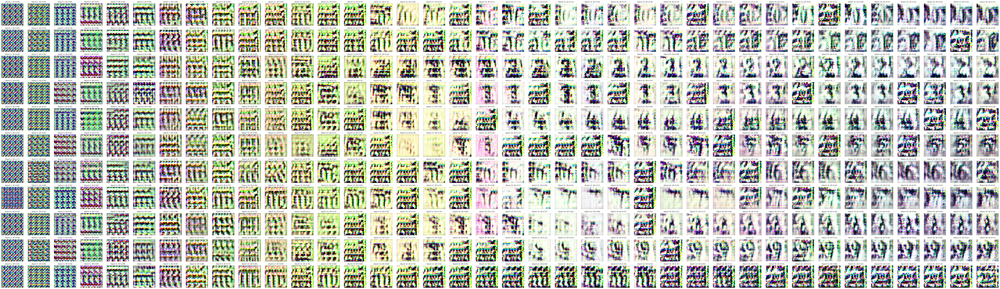

In [ ]:
visualization_dir = visualization_dir
start_epoch=1
end_epoch=38

plot_epoch_class_grid(
    viz_dir= visualization_dir,
    n_classes=11,
    start_epoch=start_epoch,
    end_epoch=end_epoch,
)

##### Metrics

In [ ]:
def build_metric_df(metrics_storage, metric_name, n_classes):
    """
    Convert metrics_storage into a DataFrame for one metric
    Rows = epochs, Columns = classes
    """
    data = {}
    for epoch, metrics in metrics_storage.items():
        values = metrics[metric_name]
        data[epoch+1] = values
    df = pd.DataFrame.from_dict(data, orient="index", columns=[f"Class_{i}" for i in range(n_classes)])
    df.index.name = "Epoch"
    return df

In [ ]:
def plot_metric_across_epochs(metric,metric_df):
  # Plot conf per class across epochs
  plt.figure(figsize=(8,4))
  for c in metric_df.columns:
      plt.plot(metric_df.index, metric_df[c], label=c)
  plt.xlabel("Epoch")
  plt.ylabel("Conf Mean")
  plt.title(f"{metric} per Class across Epochs")
  plt.legend()
  plt.xticks(metric_df.index.astype(int))
  plt.show()

In [ ]:
# Load saved metrics
metrics_storage = np.load(os.path.join(saved_model_dir, 'metrics_storage.npy'), allow_pickle=True).item()

# Build one dataframe per metric
n_classes = len(next(iter(metrics_storage.values()))["conf_mean"])  # infer class count

conf_df    = build_metric_df(metrics_storage, "conf_mean", n_classes)
ue_df      = build_metric_df(metrics_storage, "ue_mean", n_classes)
entropy_df = build_metric_df(metrics_storage, "entropy_mean", n_classes)
margin_df  = build_metric_df(metrics_storage, "margin_mean", n_classes)

# Save to CSV
conf_df.to_csv(os.path.join(saved_model_dir,'conf_mean.csv'))
ue_df.to_csv(os.path.join(saved_model_dir, 'ue_mean.csv'))
entropy_df.to_csv(os.path.join(saved_model_dir, 'entropy_mean.csv'))
margin_df.to_csv(os.path.join(saved_model_dir, 'margin_mean.csv'))

In [ ]:
conf_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.2649,0.2541,0.3069,0.3162,0.2605,0.3248,0.4646,0.3410,0.2663,0.3498,0.4032
2,0.2695,0.2221,0.1735,0.2305,0.2329,0.2016,0.2305,0.2974,0.2271,0.2159,0.2774
3,0.2592,0.4349,0.2904,0.2500,0.3579,0.2566,0.2393,0.2732,0.3580,0.2169,0.5444
4,0.3807,0.2846,0.4239,0.2624,0.2664,0.4616,0.3701,0.3469,0.4027,0.3223,0.2811
5,0.3112,0.3235,0.3592,0.3214,0.3441,0.4159,0.3343,0.2363,0.2962,0.3161,0.3204
6,0.2912,0.2556,0.3422,0.4104,0.2294,0.3508,0.3029,0.3084,0.3949,0.3332,0.2681
7,0.2667,0.2623,0.4446,0.4847,0.3712,0.3483,0.4527,0.4058,0.3123,0.4331,0.3035
8,0.3956,0.4515,0.3893,0.3296,0.3406,0.4966,0.3806,0.2371,0.3939,0.5415,0.2806
9,0.2879,0.4830,0.4228,0.3555,0.4353,0.3587,0.3902,0.4948,0.3995,0.4163,0.4534


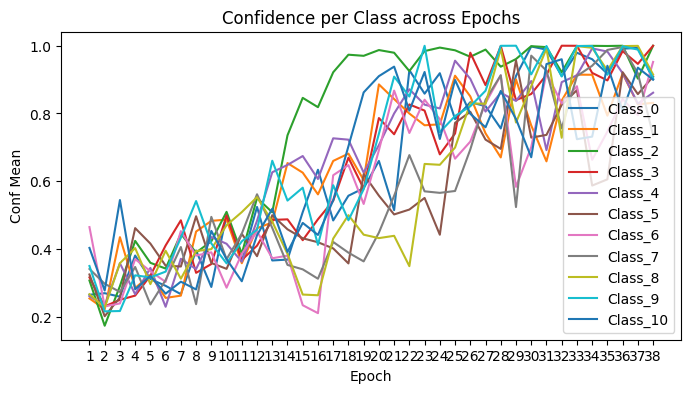

In [ ]:
plot_metric_across_epochs('Confidence',conf_df)

In [ ]:
margin_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.0903,0.1186,0.1921,0.2001,0.0962,0.1946,0.3190,0.2058,0.1688,0.2339,0.2912
2,0.0702,0.0429,0.0304,0.0752,0.0550,0.0441,0.0603,0.0705,0.0436,0.0366,0.0352
3,0.0572,0.2579,0.1037,0.0784,0.1614,0.1017,0.0837,0.1110,0.1573,0.0351,0.4231
4,0.1906,0.1164,0.2492,0.0984,0.0879,0.2922,0.2017,0.1576,0.2099,0.1238,0.1052
5,0.1334,0.1541,0.2070,0.1331,0.1774,0.2429,0.1171,0.0612,0.1072,0.1131,0.1492
6,0.1095,0.0813,0.1475,0.2483,0.0720,0.1572,0.1026,0.1006,0.1992,0.1400,0.0855
7,0.0840,0.0824,0.3054,0.3198,0.1624,0.1741,0.2897,0.2114,0.1414,0.2341,0.0976
8,0.1778,0.2276,0.2132,0.1894,0.1866,0.3270,0.1748,0.0425,0.1913,0.3696,0.1187
9,0.1219,0.3310,0.2854,0.2113,0.3244,0.1975,0.2248,0.3308,0.2303,0.2485,0.2945


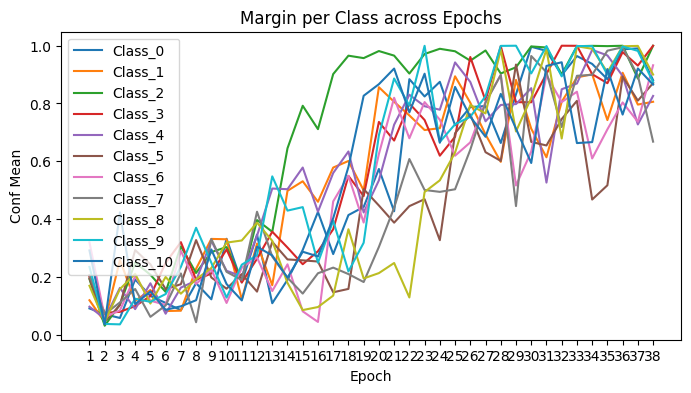

In [ ]:
plot_metric_across_epochs('Margin',margin_df)

In [ ]:
ue_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,0.8939,0.9044,0.8805,0.8671,0.8859,0.8745,0.7652,0.8513,0.9159,0.8432,0.8109
2,0.9077,0.9353,0.9622,0.9447,0.9281,0.9527,0.9393,0.8762,0.9267,0.9306,0.8770
3,0.8989,0.7829,0.8829,0.9168,0.8342,0.9057,0.9213,0.9118,0.8303,0.9269,0.6381
4,0.8341,0.8908,0.8135,0.9109,0.9111,0.7912,0.8352,0.8402,0.8242,0.8692,0.8976
5,0.8954,0.8784,0.8376,0.8762,0.8629,0.7985,0.8651,0.9308,0.8912,0.8674,0.8839
6,0.9013,0.9227,0.8633,0.8098,0.9426,0.8652,0.8909,0.8839,0.8209,0.8607,0.9088
7,0.9007,0.9175,0.7384,0.6905,0.8221,0.8292,0.7587,0.7836,0.8439,0.7380,0.8542
8,0.7812,0.7517,0.8270,0.8424,0.8308,0.7272,0.8068,0.9203,0.7882,0.6973,0.8843
9,0.8776,0.7246,0.7883,0.8166,0.7667,0.8400,0.7858,0.7160,0.7891,0.8003,0.7313


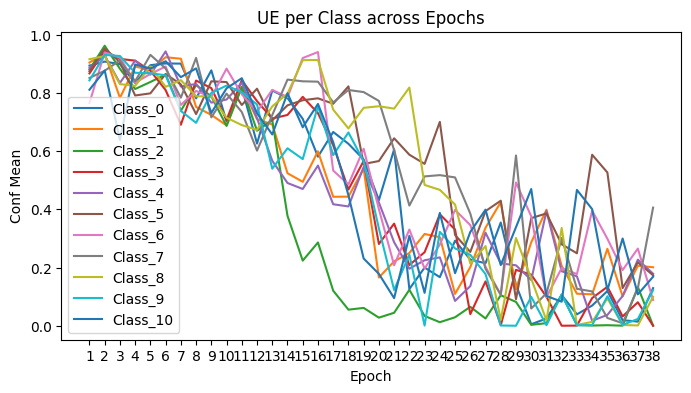

In [ ]:
plot_metric_across_epochs('UE',ue_df)

In [ ]:
entropy_df

,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9,Class_10
Epoch,,,,,,,,,,,
1,1.9704,2.0649,2.0357,1.9899,1.9856,1.9774,1.6393,1.9254,2.1493,1.9103,1.8479
2,2.0302,2.1096,2.2467,2.1716,2.1164,2.1976,2.1314,1.9123,2.1006,2.1245,1.8806
3,1.9352,1.6506,1.9651,2.0635,1.7643,2.0686,2.0466,2.0244,1.7619,2.0322,1.4079
4,1.7878,1.9809,1.7213,2.0295,2.0310,1.6794,1.8324,1.7860,1.7505,1.8751,2.0108
5,1.9900,1.9479,1.8642,1.9083,1.9030,1.6959,1.8777,2.0926,1.9568,1.8502,1.9422
6,1.9846,2.0579,1.8775,1.7702,2.1515,1.8768,1.9626,1.9091,1.7667,1.8787,2.0221
7,1.9936,2.0480,1.6246,1.4955,1.7471,1.8331,1.6435,1.6167,1.8935,1.5612,1.8194
8,1.6392,1.5045,1.7800,1.8952,1.8721,1.5318,1.7444,2.0584,1.6745,1.4361,1.9667
9,1.9626,1.5340,1.7278,1.8232,1.7240,1.8370,1.7119,1.4964,1.7267,1.6838,1.5707


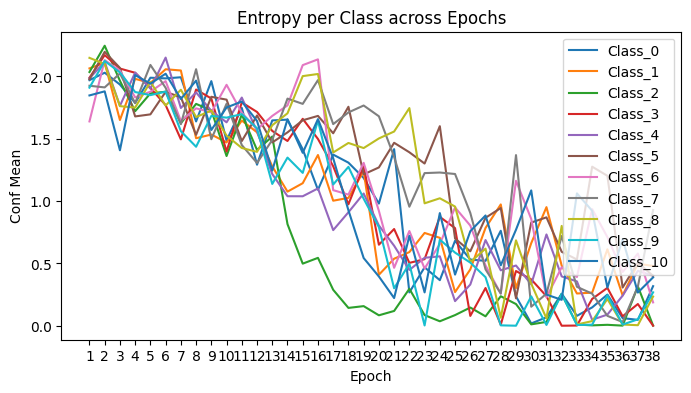

In [ ]:
plot_metric_across_epochs('Entropy',entropy_df)

---

#### Evaluation

##### Helper Functions

In [ ]:
def eval_ood_classification(model, data_loader, device, garbage_class_idx=10):
    model.eval()
    total = 0
    garbage_preds = 0

    id_confidences, id_ue, id_entropy, id_margin = [], [], [], []
    ood_confidences, ood_ue, ood_entropy, ood_margin = [], [], [], []
    all_preds = []

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, features = model(images)
            probs = F.softmax(logits, dim=1)
            confidence, preds = torch.max(probs, dim=1)
            conf, margin, ue, entropy  = compute_metrics(logits)

            for p, c,  m, u, e in zip(preds.cpu().numpy(),
                                     confidence.cpu().numpy(),
                                     margin.cpu().numpy(),
                                     ue.cpu().numpy(),
                                     entropy.cpu().numpy()):

                if p == garbage_class_idx:
                    ood_confidences.append(c)
                    ood_margin.append(m)
                    ood_ue.append(u)
                    ood_entropy.append(e)

                else:
                    id_confidences.append(c)
                    id_margin.append(m)
                    id_ue.append(u)
                    id_entropy.append(e)

                all_preds.append(p)

            garbage_preds += (preds == garbage_class_idx).sum().item()
            total += images.size(0)

    garbage_rate = garbage_preds / total

    return {
        "garbage_rate": garbage_rate,
        "all_preds": all_preds,
        "id": {
            "confidence": id_confidences,
            "ue": id_ue,
            "entropy": id_entropy,
            "margin": id_margin,},
        "ood": {
            "confidence": ood_confidences,
            "ue": ood_ue,
            "entropy": ood_entropy,
            "margin": ood_margin,}
           }

In [ ]:
def garbage_rate_table(datasets_eval):
  garbage_table = pd.DataFrame({
    "Dataset": list(datasets_eval.keys()),
    "Garbage Rate (%)": [round(eval_dict['garbage_rate']*100, 3) for eval_dict in datasets_eval.values()]})

  print("Garbage Rate Table")
  display(garbage_table)

In [ ]:
def metric_table(metric):
  table = {
        "Dataset": [],
        "ID Min": [], "ID Max": [], "ID Mean": [], "ID Std": [],
        "OOD Min": [], "OOD Max": [], "OOD Mean": [], "OOD Std": []
    }

  for name, eval_dict in datasets_eval.items():
      id_vals  = np.array(eval_dict['id'][metric])
      ood_vals = np.array(eval_dict['ood'][metric])

      table["Dataset"].append(name)
      table["ID Min"].append(np.min(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Max"].append(np.max(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Mean"].append(np.mean(id_vals) if len(id_vals) > 0 else np.nan)
      table["ID Std"].append(np.std(id_vals) if len(id_vals) > 0 else np.nan)

      table["OOD Min"].append(np.min(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Max"].append(np.max(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Mean"].append(np.mean(ood_vals) if len(ood_vals) > 0 else np.nan)
      table["OOD Std"].append(np.std(ood_vals) if len(ood_vals) > 0 else np.nan)

  df = pd.DataFrame(table)
  print(f"\n Metric: {metric.upper()}")
  display(df)
  # return df

In [ ]:
def garbage_rate_after_metric_threshold(model, data_loader, device, metric_name, threshold, garbage_class_idx=10):
    """Compute garbage rate given a metric and threshold"""
    model.eval()
    total = 0
    garbage_preds = 0

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, _ = model(images)
            probs = F.softmax(logits, dim=1)
            confidence, preds = torch.max(probs, dim=1)

            # Compute metrics
            conf, margin, ue, entropy = compute_metrics(logits)

            metric_values = {
                "confidence": conf,
                "margin": margin,
                "ue": ue,
                "entropy": entropy
            }[metric_name]

            for p, m in zip(preds.cpu().numpy(), metric_values.cpu().numpy()):
                # Threshold rule
                if metric_name in ["confidence", "margin"]:
                    if p != garbage_class_idx:
                      if m < threshold:
                        garbage_preds += 1
                    else:
                        garbage_preds +=1
                else:  # entropy, ue → higher = OOD
                    if p != garbage_class_idx:
                      if m > threshold:
                        garbage_preds += 1
                    else:
                        garbage_preds +=1

            total += images.size(0)

    garbage_rate = garbage_preds / total
    return garbage_rate

In [ ]:
def garbage_rate_metric_threshold_table(model, datasets, device, metric_name, thresholds):
    results = []

    for t in thresholds:
        row = {"Threshold": t}
        for name, loader in datasets.items():
            rate = garbage_rate_after_metric_threshold(model, loader, device, metric_name, t)
            row[name] = rate * 100
        results.append(row)

    df = pd.DataFrame(results)

    # Format all numeric values to 2 decimal places
    df = df.round(2)

    print(f"\n Garbage Rate Table (in %): [{metric_name} Threshold]")
    display(df)

---

##### Tiny_Imagenet_200

In [ ]:
# folder_path = "/content/data/tiny-imagenet-200"
# # Check if folder exists before deleting
# if os.path.exists(folder_path) and os.path.isdir(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Deleted folder: {folder_path}")
# else:
#     print("Folder does not exist!")

Folder does not exist!


In [ ]:
! wget http://cs231n.stanford.edu/tiny-imagenet-200.zip
! unzip tiny-imagenet-200.zip -d /content/ood_datasets

Streaming output truncated to the last 5000 lines.
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3979.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3963.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_7199.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_2752.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9687.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9407.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3603.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_3412.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_6982.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_8496.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_7332.JPEG  
  inflating: /content/ood_datasets/tiny-imagenet-200/val/images/val_9

In [ ]:
val_dir = "/content/ood_datasets/tiny-imagenet-200/val"
images_dir = os.path.join(val_dir, "images")
ann_file = os.path.join(val_dir, "val_annotations.txt")

with open(ann_file, "r") as f:
    for line in f.readlines():
        img, cls = line.strip().split("\t")[:2]
        cls_dir  = os.path.join(val_dir, cls)
        os.makedirs(cls_dir, exist_ok=True)
        shutil.move(os.path.join(images_dir, img), os.path.join(cls_dir, img))

shutil.rmtree(images_dir)

#### Using svhn Statistics for all ood datasets

In [ ]:
svhn_mean = (0.4377, 0.4438, 0.4728)
svhn_std  = (0.1980, 0.2010, 0.1970)

# Transform for grayscale datasets (MNIST, Fashion-MNIST)
ood_transform_gray = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Convert to RGB
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize(svhn_mean, svhn_std)
])

# Transform for already-RGB datasets (CIFAR10, CIFAR-100, TinyImageNet, LSUN, CelebA)
ood_transform_rgb = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    transforms.Normalize(svhn_mean, svhn_std)
])

In [ ]:
# ------------------ Grayscale datasets ------------------
mnist_testset   = datasets.MNIST(root='/content/ood_datasets/MNIST', train=False, download=True, transform=ood_transform_gray)
fmnist_testset  = datasets.FashionMNIST(root='/content/ood_datasets/FMNIST', train=False, download=True, transform=ood_transform_gray)

# ------------------ RGB datasets ------------------
cifar10_testset    = datasets.CIFAR10(root='/content/ood_datasets/CIFAR10', train=False, download=True, transform=ood_transform_rgb)
cifar100_testset    = datasets.CIFAR100(root='/content/ood_datasets/CIFAR100', train=False, download=True, transform=ood_transform_rgb)

# TinyImageNet (resize to 32×32) – validation split
tinyimagenet_val    = datasets.ImageFolder(root='/content/ood_datasets/tiny-imagenet-200/val', transform=ood_transform_rgb)

# # LSUN (classroom / resize) – one or more classes
# lsun_val            = datasets.ImageFolder(root=os.path.join(lsun_data_dir, "classroom_val"), transform=ood_transform_rgb)

# CelebA – center crop then resize
# celeba_val          = datasets.CelebA(root='/content/data', split='test', download=True,
#                                       transform=transforms.Compose([
#                                           transforms.CenterCrop(148),
#                                           transforms.Resize((32, 32)),
#                                           transforms.ToTensor(),
#                                           transforms.Normalize(cifar_mean, cifar_std)
#                                       ]))

100%|██████████| 9.91M/9.91M [00:01<00:00, 6.08MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 160kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.52MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 8.07MB/s]
100%|██████████| 26.4M/26.4M [00:03<00:00, 8.00MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 130kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 2.48MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 3.22MB/s]
100%|██████████| 170M/170M [00:11<00:00, 15.4MB/s]
100%|██████████| 169M/169M [00:10<00:00, 15.8MB/s]


In [ ]:
# ------------------ DataLoaders ------------------
batch_size = 32
mnist_loader       = DataLoader(mnist_testset,  batch_size=batch_size, shuffle=False)
fmnist_loader      = DataLoader(fmnist_testset, batch_size=batch_size, shuffle=False)
cifar10_loader     = DataLoader(cifar10_testset,   batch_size=batch_size, shuffle=False)
cifar100_loader    = DataLoader(cifar100_testset,   batch_size=batch_size, shuffle=False)
tiny_loader        = DataLoader(tinyimagenet_val,   batch_size=batch_size, shuffle=False)
# lsun_loader      = DataLoader(lsun_val,           batch_size=batch_size, shuffle=False)
# celeba_loader      = DataLoader(celeba_val,         batch_size=batch_size, shuffle=False)

#### Before Inversion

In [ ]:
model_before_inv_pth = os.path.join(saved_model_dir, "checkpoint_csf_initial.pt")
checkpoint = torch.load(model_before_inv_pth,map_location='cpu')
nc = 3
ncf = 32

model_before_inv = Classifier(nc, ncf)
model_before_inv.load_state_dict(checkpoint['model_state_dict'])
model_before_inv.to(device)
model_before_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [ ]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(model_before_inv,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 814/814 [00:41<00:00, 19.64it/s, Batch Loss=2.15]


Test Loss:1.3448,  Test Accuracy: 0.5526


In [ ]:
eval_svhn       = eval_ood_classification(model_before_inv, test_loader,  device)
eval_mnist      = eval_ood_classification(model_before_inv, mnist_loader, device)
eval_fmnist     = eval_ood_classification(model_before_inv, fmnist_loader,  device)
eval_cifar10       = eval_ood_classification(model_before_inv, cifar10_loader,   device)
eval_cifar100   = eval_ood_classification(model_before_inv, cifar100_loader,   device)
eval_tiny_imagenet200  = eval_ood_classification(model_before_inv, tiny_loader, device)
# eval_celeba     = eval_ood_classification(model_before_inv, celeba_loader,   device)

In [ ]:
# List of datasets
datasets_eval = {
    "SVHN": eval_svhn,
    "MNIST": eval_mnist,
    "FashionMNIST": eval_fmnist,
    "CIFAR-10": eval_cifar10,
    "CIFAR-100": eval_cifar100,
    "TinyImageNet200": eval_tiny_imagenet200,
    # "CelebA": eval_celeba,
}

In [ ]:
garbage_rate_table(datasets_eval)

Garbage Rate Table


,Dataset,Garbage Rate (%)
0,SVHN,0.004
1,MNIST,0.000
2,FashionMNIST,0.110
3,CIFAR-10,1.740
4,CIFAR-100,1.160
5,TinyImageNet200,0.870


In [ ]:
metric_table('ue')


 Metric: UE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.000627,0.994207,0.770546,0.200806,0.967436,0.967436,0.967436,0.000000
1,MNIST,0.000227,0.975491,0.430391,0.266789,NaN,NaN,NaN,NaN
2,FashionMNIST,0.001291,0.984353,0.718082,0.242454,0.084156,0.931393,0.509199,0.325914
3,CIFAR-10,0.004045,0.991921,0.809608,0.149311,0.164140,0.984764,0.813461,0.158390
4,CIFAR-100,0.008226,0.994466,0.823750,0.147986,0.025014,0.987218,0.816533,0.179188
5,TinyImageNet200,0.006283,0.991726,0.811157,0.158323,0.144422,0.988376,0.792406,0.174972


In [ ]:
metric_table('entropy')


 Metric: ENTROPY


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.003029,2.363855,1.615585,0.458772,2.238352,2.238352,2.238352,0.000000
1,MNIST,0.001167,2.256603,0.791834,0.502205,NaN,NaN,NaN,NaN
2,FashionMNIST,0.005438,2.299849,1.464022,0.564066,0.211839,2.065249,1.075078,0.692636
3,CIFAR-10,0.016760,2.354109,1.712975,0.379943,0.396043,2.327759,1.759281,0.396906
4,CIFAR-100,0.028990,2.370396,1.756736,0.378596,0.083518,2.327831,1.809602,0.419876
5,TinyImageNet200,0.023494,2.357067,1.722130,0.395055,0.375011,2.335374,1.716632,0.416618


In [ ]:
metric_table('confidence')


 Metric: CONFIDENCE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.117377,0.999715,0.427379,0.203164,0.215994,0.215994,0.215994,0.000000
1,MNIST,0.169049,0.999897,0.715778,0.214011,NaN,NaN,NaN,NaN
2,FashionMNIST,0.129536,0.999413,0.466415,0.221762,0.227641,0.960758,0.641972,0.280909
3,CIFAR-10,0.123731,0.998159,0.397365,0.161332,0.153471,0.921318,0.399913,0.165987
4,CIFAR-100,0.120078,0.996251,0.379894,0.161712,0.150779,0.988551,0.403243,0.177515
5,TinyImageNet200,0.118745,0.997139,0.393552,0.167887,0.145956,0.931509,0.418876,0.183866


In [ ]:
metric_table('margin')


 Metric: MARGIN


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.000004,0.999573,0.241934,0.242477,0.081219,0.081219,0.081219,0.000000
1,MNIST,0.000141,0.999845,0.555856,0.311806,NaN,NaN,NaN,NaN
2,FashionMNIST,0.000035,0.998969,0.269597,0.272143,0.012315,0.942269,0.508515,0.355953
3,CIFAR-10,0.000003,0.997529,0.196905,0.184736,0.001688,0.880822,0.210256,0.197951
4,CIFAR-100,0.000016,0.993836,0.182645,0.182907,0.000095,0.984747,0.238759,0.219126
5,TinyImageNet200,0.000006,0.995845,0.197176,0.194380,0.001471,0.907390,0.235949,0.228980


### After Inversion

##### Evaluating the model with best test accuracy

In [ ]:
model_after_inv_pth = os.path.join(saved_model_dir,'csf_model.pth')
nc = 3
ncf = 32

model_after_inv = Classifier(nc, ncf)
model_after_inv.load_state_dict(torch.load(model_after_inv_pth, map_location=device))
model_after_inv.to(device)
model_after_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [ ]:
csf_criterion_test = nn.CrossEntropyLoss()
test_loss, test_accuracy   = test(model_after_inv,  test_loader, csf_criterion_test, device)
print(f"\nTest Loss:{test_loss:.4f},  Test Accuracy: {test_accuracy:.4f}")

Testing: 100%|██████████| 814/814 [00:31<00:00, 25.70it/s, Batch Loss=0.241]


Test Loss:0.2200,  Test Accuracy: 0.9407


In [ ]:
eval_svhn       = eval_ood_classification(model_after_inv, test_loader,  device)
eval_mnist      = eval_ood_classification(model_after_inv, mnist_loader, device)
eval_fmnist     = eval_ood_classification(model_after_inv, fmnist_loader,  device)
eval_cifar10       = eval_ood_classification(model_after_inv, cifar10_loader,   device)
eval_cifar100   = eval_ood_classification(model_after_inv, cifar100_loader,   device)
eval_tiny_imagenet200  = eval_ood_classification(model_after_inv, tiny_loader, device)
# eval_celeba     = eval_ood_classification(model_before_inv, celeba_loader,   device)

In [ ]:
# List of datasets
datasets_eval = {
    "SVHN": eval_svhn,
    "MNIST": eval_mnist,
    "FashionMNIST": eval_fmnist,
    "CIFAR-10": eval_cifar10,
    "CIFAR-100": eval_cifar100,
    "TinyImageNet200": eval_tiny_imagenet200,
    # "CelebA": eval_celeba,
}

In [ ]:
garbage_rate_table(datasets_eval)

Garbage Rate Table


,Dataset,Garbage Rate (%)
0,SVHN,0.012
1,MNIST,0.010
2,FashionMNIST,0.290
3,CIFAR-10,3.470
4,CIFAR-100,4.490
5,TinyImageNet200,3.780


In [ ]:
metric_table('ue')


 Metric: UE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.000000,0.971701,0.123776,0.220039,4.619342e-02,0.787204,0.436540,0.303815
1,MNIST,0.000000,0.960335,0.218543,0.263440,2.758703e-01,0.275870,0.275870,0.000000
2,FashionMNIST,0.000052,0.989563,0.657633,0.266449,0.000000e+00,0.890723,0.390862,0.317562
3,CIFAR-10,0.000789,0.989430,0.785506,0.191676,2.443790e-06,0.978175,0.580761,0.289336
4,CIFAR-100,0.000000,0.990884,0.763474,0.208808,5.364418e-07,0.983263,0.518977,0.322531
5,TinyImageNet200,0.000044,0.994439,0.777516,0.202974,0.000000e+00,0.982652,0.554183,0.318455


In [ ]:
metric_table('confidence')


 Metric: CONFIDENCE


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.170161,1.000000,0.923115,0.153598,0.401789,0.978661,0.691414,0.235513
1,MNIST,0.172599,1.000000,0.858163,0.190412,0.860686,0.860686,0.860686,0.000000
2,FashionMNIST,0.133215,0.999976,0.528595,0.231641,0.279388,1.000000,0.742431,0.235002
3,CIFAR-10,0.127112,0.999641,0.417408,0.189840,0.154913,0.999999,0.602841,0.238656
4,CIFAR-100,0.134817,1.000000,0.437137,0.200137,0.166766,1.000000,0.645157,0.254991
5,TinyImageNet200,0.125042,0.999980,0.422897,0.197652,0.160597,1.000000,0.614591,0.258875


In [ ]:
metric_table('margin')


 Metric: MARGIN


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,0.000171,1.000000,0.879500,0.235129,0.067826,0.964326,0.477748,0.369987
1,MNIST,0.000014,1.000000,0.764448,0.307873,0.791960,0.791960,0.791960,0.000000
2,FashionMNIST,0.000007,0.999954,0.342915,0.299306,0.031425,1.000000,0.615958,0.334172
3,CIFAR-10,0.000003,0.999468,0.227995,0.227324,0.002247,0.999998,0.448956,0.315632
4,CIFAR-100,0.000006,1.000000,0.246829,0.242594,0.001883,1.000000,0.505403,0.343351
5,TinyImageNet200,0.000046,0.999962,0.233914,0.237173,0.000666,1.000000,0.468636,0.345338


In [ ]:
metric_table('entropy')


 Metric: ENTROPY


,Dataset,ID Min,ID Max,ID Mean,ID Std,OOD Min,OOD Max,OOD Mean,OOD Std
0,SVHN,4.334618e-11,2.221731,0.246663,0.421166,1.234146e-01,1.591869,0.802073,0.604623
1,MNIST,4.494827e-12,2.157507,0.389687,0.465737,5.403232e-01,0.540323,0.540323,0.000000
2,FashionMNIST,2.812571e-04,2.338094,1.334855,0.577633,3.001513e-09,1.787832,0.761426,0.636325
3,CIFAR-10,3.535417e-03,2.345316,1.663994,0.454735,1.664703e-05,2.291804,1.214290,0.625110
4,CIFAR-100,1.552953e-10,2.350050,1.606730,0.489965,4.275593e-06,2.317822,1.082362,0.681247
5,TinyImageNet200,2.410649e-04,2.369167,1.646682,0.479046,3.508488e-09,2.312704,1.159197,0.672014


#### Applying Threshold

In [ ]:
datasets = {
    "SVHN": test_loader,
    "MNIST": mnist_loader,
    "FashionMNIST": fmnist_loader,
    "CIFAR10": cifar10_loader,
    "CIFAR-100": cifar100_loader,
    "TinyImageNet200": tiny_loader,
    # "CelebA": celeba_loader,
}

##### UE Threshold

In [175]:
ue_thresholds = [0.1,0.3, 0.5]

In [176]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"ue", ue_thresholds)


 Garbage Rate Table (in %): [ue Threshold]


,Threshold,SVHN,MNIST,FashionMNIST,CIFAR10,CIFAR-100,TinyImageNet200
0,0.1,98.92,84.90,95.20,99.80,99.71,99.57
1,0.3,95.54,64.00,91.61,98.66,98.73,98.07
2,0.5,88.81,43.86,85.30,95.48,95.94,94.76


In [177]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"ue", ue_thresholds)


 Garbage Rate Table (in %): [ue Threshold]


,Threshold,SVHN,MNIST,FashionMNIST,CIFAR10,CIFAR-100,TinyImageNet200
0,0.1,27.06,46.75,93.35,99.03,98.30,98.65
1,0.3,16.41,32.51,86.40,96.23,95.15,95.36
2,0.5,10.19,20.71,76.70,90.90,88.65,90.00


##### Conf_Threshold

In [ ]:
conf_thresholds = [0.7,0.85, 0.9, 0.95]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"confidence", conf_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"confidence", conf_thresholds)

##### Margin_Threshold

In [ ]:
margin_thresholds = [0.8, 0.9, 0.95]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"margin", margin_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"margin", margin_thresholds)

##### Entropy_Threshold

In [ ]:
entropy_thresholds = [0.1,0.2,0.3,0.5,0.8]

In [ ]:
garbage_rate_metric_threshold_table(model_before_inv, datasets, device,"entropy", entropy_thresholds)

In [ ]:
garbage_rate_metric_threshold_table(model_after_inv, datasets, device,"entropy", entropy_thresholds)

### AUROC, AUPR, FPR@95TPR
* AUROC (Area Under ROC Curve) → measures overall separability between ID vs OOD.

* AUPR (Area Under Precision-Recall Curve) → emphasizes precision when positives are rare.

* FPR@95TPR → false positive rate when true positive rate = 95%.

##### Helper Functions

In [ ]:
def compute_auroc_aupr_fpr95(id_scores, ood_scores):
    """
    Compute AUROC, AUPR, and FPR@95TPR
    Label convention: 0 = ID, 1 = OOD
    """
    y_true  = np.concatenate([np.zeros_like(id_scores), np.ones_like(ood_scores)])
    y_score = np.concatenate([id_scores, ood_scores])

    # AUROC
    try:
        auroc = roc_auc_score(y_true, y_score)
    except:
        auroc = np.nan

    # AUPR
    try:
        precision, recall, _ = precision_recall_curve(y_true, y_score)
        aupr = auc(recall, precision)
    except:
        aupr = np.nan

    # FPR@95TPR
    try:
        fpr, tpr, _ = roc_curve(y_true, y_score)
        idx = np.where(tpr >= 0.95)[0]
        fpr95 = fpr[idx[0]] if len(idx) > 0 else 1.0
    except:
        fpr95 = np.nan

    return round(auroc, 4), round(aupr, 4), round(fpr95, 4), fpr, tpr, precision, recall

In [ ]:
def compute_mahalanobis_stats(model, loader, device):
    model.eval()
    all_feats, all_labels = [], []

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            _,feats = model(x)
            all_feats.append(feats)
            all_labels.append(y)

    feats = torch.cat(all_feats)
    labels = torch.cat(all_labels)
    num_classes = len(torch.unique(labels))

    class_means = []
    for c in range(num_classes):
        class_feats = feats[labels == c]
        class_means.append(class_feats.mean(0))

    cov = torch.cov(feats.T)
    cov_inv = torch.inverse(cov + 1e-5 * torch.eye(cov.shape[0], device=device))

    return class_means, cov_inv

In [ ]:
# Mahalanobis (requires precomputed class means + covariance inverse)
def score_mahalanobis(features, class_means, cov_inv):
    dists = []
    for mu_c in class_means:
        diff = features - mu_c
        dist = torch.einsum('bi,ij,bj->b', diff, cov_inv, diff)
        dists.append(dist)
    return -torch.min(torch.stack(dists, dim=1), dim=1)[0]  # negative = higher confidence

In [ ]:
def get_metric_scores(exclude_garbage, model, data_loader, device, metric_name, temperature=1.0,
                               class_means=None, cov_inv=None):
    """
    Get metric scores for a dataset.
    Supports: confidence, margin, ue, entropy, energy, msp, odin, mahalanobis
    """
    model.eval()
    metric_scores = []

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            logits, feats = model(images)

            if exclude_garbage:
                logits = logits[:, :10]

            if metric_name in ["confidence", "margin", "ue", "entropy"]:
                confidence, margin, ue, entropy = compute_metrics(logits)
                metric_values = {
                    "confidence": confidence,
                    "margin": margin,
                    "ue": ue,
                    "entropy": entropy
                }[metric_name]

            elif metric_name == "energy":
                metric_values = -temperature * torch.logsumexp(logits / temperature, dim=1)

            elif metric_name == "msp":
                metric_values = torch.max(F.softmax(logits, dim=1), dim=1)[0]

            elif metric_name == "odin":
                metric_values = torch.max(F.softmax(logits / temperature, dim=1), dim=1)[0]

            elif metric_name == "mahalanobis":
                if class_means is None or cov_inv is None:
                    raise ValueError("class_means and cov_inv must be provided for Mahalanobis score")
                metric_values = score_mahalanobis(feats, class_means, cov_inv)

            else:
                raise ValueError(f"Unknown metric_name: {metric_name}")

            metric_scores.extend(metric_values.cpu().numpy())

    return np.array(metric_scores)

In [ ]:
def comprehensive_ood_analysis(exclude_garbage, model, datasets, device, metric_name, id_name,
                                        temperature=1.0, class_means=None, cov_inv=None):
    """
    Comprehensive OOD analysis supporting multiple metrics including Mahalanobis.
    """
    if exclude_garbage:
        print(f"COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - {metric_name.upper()}")
    else:
        print(f"COMPREHENSIVE OOD ANALYSIS (Garbage class included) - {metric_name.upper()}")

    # Get ID scores
    id_scores = get_metric_scores(exclude_garbage, model, datasets[id_name], device,
                                           metric_name, temperature, class_means, cov_inv)

    results = []

    for ood_name, ood_loader in datasets.items():
        if ood_name == id_name:
            continue

        ood_scores = get_metric_scores(exclude_garbage, model, ood_loader, device,
                                                metric_name, temperature, class_means, cov_inv)

        flip_sign = -1 if metric_name in ["msp", "odin", "mahalanobis"] else 1
        id_eval = id_scores * flip_sign
        ood_eval = ood_scores * flip_sign

        auroc, aupr, fpr_95tpr, fpr, tpr, precision, recall = compute_auroc_aupr_fpr95(id_eval, ood_eval)
        id_mean = np.mean(id_scores)
        ood_mean = np.mean(ood_scores)
        separation = abs(id_mean - ood_mean)

        results.append({
            'OOD Dataset': ood_name,
            'AUROC': auroc,
            'AUPR': aupr,
            'FPR@95TPR': fpr_95tpr,
            f'ID {metric_name} Mean': round(id_mean, 4),
            f'OOD {metric_name} Mean': round(ood_mean, 4),
            'Separation': round(separation, 4),
            'FPR_curve': fpr,
            'TPR_curve': tpr,
            'Precision_curve': precision,
            'Recall_curve': recall,
            'ID_scores': id_scores,
            'OOD_scores':ood_scores
        })

    df_summary = pd.DataFrame([{k: r[k] for k in ['OOD Dataset', 'AUROC', 'AUPR', 'FPR@95TPR',
                                                  f'ID {metric_name} Mean', f'OOD {metric_name} Mean',
                                                  'Separation']} for r in results])
    display(df_summary)
    print(f"\nAvg AUROC = {df_summary['AUROC'].mean():.4f} | "
          f"Avg AUPR = {df_summary['AUPR'].mean():.4f} | "
          f"Avg FPR@95TPR = {df_summary['FPR@95TPR'].mean():.4f}")

    return df_summary, results

In [ ]:
def plot_ood_metrics(df, metric_name):
    """
    Plots AUROC, AUPR, and FPR@95TPR results for OOD analysis
    """
    sns.set(style="whitegrid", font_scale=1.1)
    fig, axes = plt.subplots(1, 3, figsize=(25, 6))

    # --- AUROC ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="AUROC",
        ax=axes[0],
        palette="Blues_d",
        hue = "OOD Dataset",
        legend=False
    )
    axes[0].set_title(f"{metric_name.upper()} - AUROC", fontsize=14, fontweight='bold')
    axes[0].set_ylim(0, 1)
    for i, val in enumerate(df["AUROC"]):
        axes[0].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    # --- AUPR ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="AUPR",
        ax=axes[1],
        palette="Greens_d",
         hue = "OOD Dataset",
        legend=False
    )
    axes[1].set_title(f"{metric_name.upper()} - AUPR", fontsize=14, fontweight='bold')
    axes[1].set_ylim(0, 1)
    for i, val in enumerate(df["AUPR"]):
        axes[1].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    # --- FPR@95TPR ---
    sns.barplot(
        data=df,
        x="OOD Dataset",
        y="FPR@95TPR",
        ax=axes[2],
        palette="Reds_d",
        hue = "OOD Dataset",
        legend=False
    )
    axes[2].set_title(f"{metric_name.upper()} - FPR@95TPR", fontsize=14, fontweight='bold')
    axes[2].set_ylim(0, 1)
    for i, val in enumerate(df["FPR@95TPR"]):
        axes[2].text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10)

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_ood_curves(results, metric_name):
    """
    Plots ROC and PR curves for each OOD dataset.
    """
    sns.set(style="whitegrid", font_scale=1.1)
    fig, axes = plt.subplots(1, 2, figsize=(25, 6))

    # --- ROC Curves ---
    for res in results:
        axes[0].plot(
            res['FPR_curve'], res['TPR_curve'],
            label=f"{res['OOD Dataset']} (AUROC={res['AUROC']:.3f})"
        )
    axes[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axes[0].set_title(f"{metric_name.upper()} - ROC Curve", fontsize=14, fontweight='bold')
    axes[0].set_xlabel("False Positive Rate")
    axes[0].set_ylabel("True Positive Rate")
    axes[0].legend()
    axes[0].grid(True)

    # --- Precision-Recall Curves ---
    for res in results:
        axes[1].plot(
            res['Recall_curve'], res['Precision_curve'],
            label=f"{res['OOD Dataset']} (AUPR={res['AUPR']:.3f})"
        )
    axes[1].set_title(f"{metric_name.upper()} - Precision-Recall Curve", fontsize=14, fontweight='bold')
    axes[1].set_xlabel("Recall")
    axes[1].set_ylabel("Precision")
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


In [ ]:
def plot_metric_comparison(df, metric_label):
    df_melt = df.melt(id_vars="OOD Dataset", var_name="Method", value_name=metric_label)
    plt.figure(figsize=(8,4))
    sns.barplot(data=df_melt, x="OOD Dataset", y=metric_label, hue="Method")
    plt.title(f"{metric_label} Comparison Across Methods", fontsize=14, fontweight='bold')
    plt.ylim(0,1)
    plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
    plt.show()

In [ ]:
def plot_separation_for_method(results, method_name, target_tpr=0.95, bins=50):
    """
    Plots score separation for a method across all OOD datasets (like Energy paper).

    Parameters:
        results: list of dicts returned by comprehensive_ood_analysis_with_scores
        method_name: str, name of the metric
        target_tpr: float, TPR to compute threshold
        bins: int, histogram bins
    """
    num_ood = len(results)
    fig, axes = plt.subplots(1, num_ood, figsize=(6*num_ood, 5), sharey=True)

    if num_ood == 1:
        axes = [axes]

    for ax, res in zip(axes, results):

        id_scores  = res['ID_scores']
        ood_scores = res['OOD_scores']

        flip_sign=-1 if method_name in ["msp","odin","mahalanobis"] else 1
        id_scores  = flip_sign*id_scores
        ood_scores = flip_sign*ood_scores

        # Compute threshold for target TPR
        y_true = np.concatenate([np.zeros_like(id_scores), np.ones_like(ood_scores)])
        y_score = np.concatenate([id_scores, ood_scores])
        fpr, tpr, thresholds = roc_curve(y_true, y_score)
        idx = np.where(tpr >= target_tpr)[0]
        threshold = thresholds[idx[0]] if len(idx) > 0 else thresholds[-1]

        # Plot ID and OOD distributions
        sns.histplot(id_scores, color='blue', kde=True, stat='density', bins=bins, alpha=0.6, ax=ax, label='ID')
        sns.histplot(ood_scores, color='red', kde=True, stat='density', bins=bins, alpha=0.6, ax=ax, label='OOD')
        ax.axvline(threshold, color='black', linestyle='--', label=f'Threshold (TPR={target_tpr*100:.0f}%, Threshold={threshold:0.6f})')
        ax.set_title(res['OOD Dataset'], fontsize=14, fontweight='bold')
        ax.set_xlabel("Score")
        ax.set_ylabel("Density")
        ax.legend()

    plt.suptitle(f"Score Separation - {method_name}", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

##### Excluding Garbage class

In [ ]:
datasets = {
    "SVHN": test_loader,
    "MNIST": mnist_loader,
    "FashionMNIST": fmnist_loader,
    "CIFAR10": cifar10_loader,
    "CIFAR-100": cifar100_loader,
    "TinyImageNet200": tiny_loader,
    # "CelebA": celeba_loader,
}

In [ ]:
model_after_inv_pth = os.path.join(saved_model_dir,'csf_model.pth')
nc = 3
ncf = 32

model_after_inv = Classifier(nc, ncf)
model_after_inv.load_state_dict(torch.load(model_after_inv_pth, map_location=device))
model_after_inv.to(device)
model_after_inv.eval()

Classifier(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [ ]:
id_name = "SVHN"

In [ ]:
# Compute class statistics from ID dataset(for mahalanobis)
class_means, cov_inv = compute_mahalanobis_stats(model_after_inv, datasets[id_name], device)

In [ ]:
exclude_garbage = True
temperature = 1000.0

###### UE

In [ ]:
metric = "ue"

In [ ]:
df_ue, results_ue = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - UE


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID ue Mean,OOD ue Mean,Separation
0,MNIST,0.6033,0.3599,0.9624,0.125,0.2207,0.0958
1,FashionMNIST,0.9233,0.8127,0.3186,0.125,0.6633,0.5383
2,CIFAR10,0.9645,0.9047,0.1515,0.125,0.7863,0.6614
3,CIFAR-100,0.9574,0.8895,0.1698,0.125,0.7645,0.6395
4,TinyImageNet200,0.9614,0.9004,0.1647,0.125,0.7792,0.6543



Avg AUROC = 0.8820 | Avg AUPR = 0.7734 | Avg FPR@95TPR = 0.3534


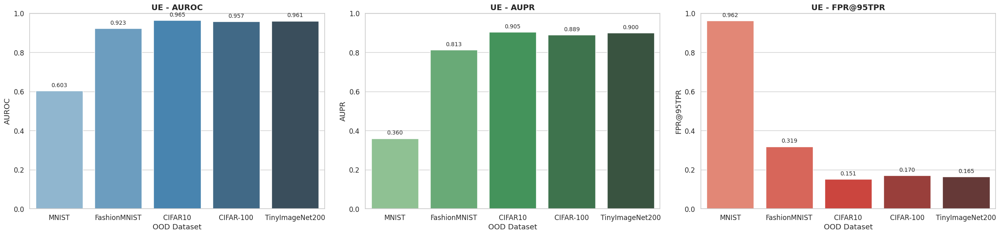

In [ ]:
plot_ood_metrics(df_ue, metric)

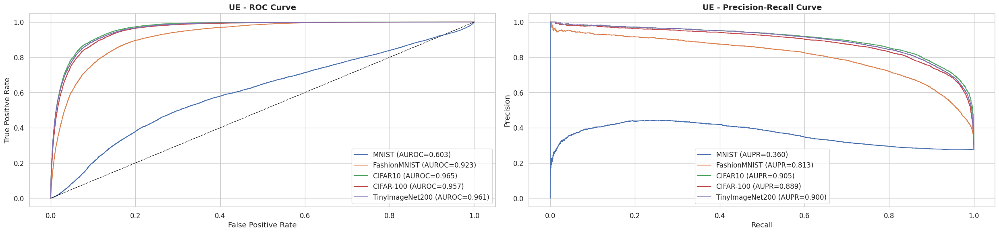

In [ ]:
plot_ood_curves(results_ue, metric)

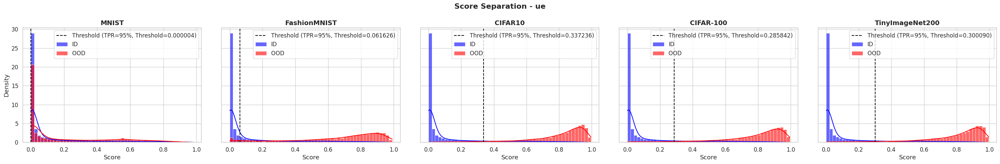

In [ ]:
plot_separation_for_method(results_ue, method_name="ue", target_tpr=0.95)

###### MSP(Max-Softmax Probability)

In [ ]:
metric = "msp"

In [ ]:
df_msp, results_msp = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name= id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - MSP


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID msp Mean,OOD msp Mean,Separation
0,MNIST,0.6047,0.3657,0.9624,0.9232,0.8582,0.0650
1,FashionMNIST,0.9207,0.8035,0.3188,0.9232,0.5293,0.3938
2,CIFAR10,0.9608,0.8920,0.1537,0.9232,0.4236,0.4995
3,CIFAR-100,0.9540,0.8771,0.1706,0.9232,0.4433,0.4799
4,TinyImageNet200,0.9579,0.8883,0.1653,0.9232,0.4284,0.4948



Avg AUROC = 0.8796 | Avg AUPR = 0.7653 | Avg FPR@95TPR = 0.3542


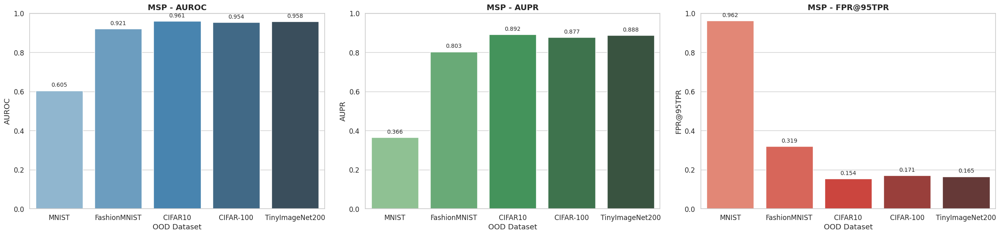

In [ ]:
plot_ood_metrics(df_msp, metric)

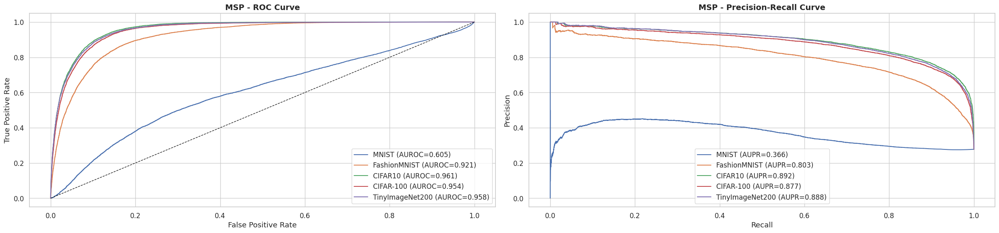

In [ ]:
plot_ood_curves(results_msp, metric)

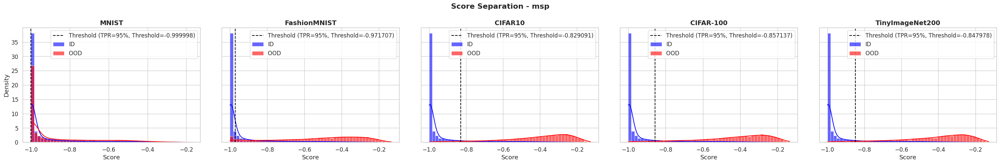

In [ ]:
plot_separation_for_method(results_msp, method_name=metric, target_tpr=0.95)

###### ODIN(Out-of-distrbution detector for Neural Networks)

In [ ]:
metric = "odin"

In [ ]:
df_odin, results_odin = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - ODIN


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID odin Mean,OOD odin Mean,Separation
0,MNIST,0.4855,0.2708,0.9782,0.1009,0.1010,0.0000
1,FashionMNIST,0.9185,0.8081,0.3573,0.1009,0.1003,0.0006
2,CIFAR10,0.9693,0.9148,0.1259,0.1009,0.1002,0.0007
3,CIFAR-100,0.9607,0.8977,0.1568,0.1009,0.1002,0.0007
4,TinyImageNet200,0.9664,0.9108,0.1410,0.1009,0.1002,0.0007



Avg AUROC = 0.8601 | Avg AUPR = 0.7604 | Avg FPR@95TPR = 0.3518


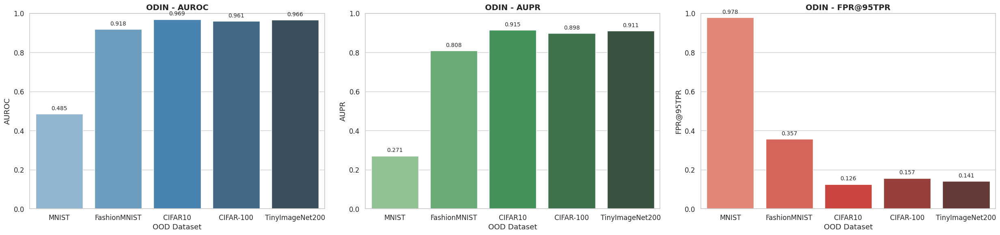

In [ ]:
plot_ood_metrics(df_odin, metric)

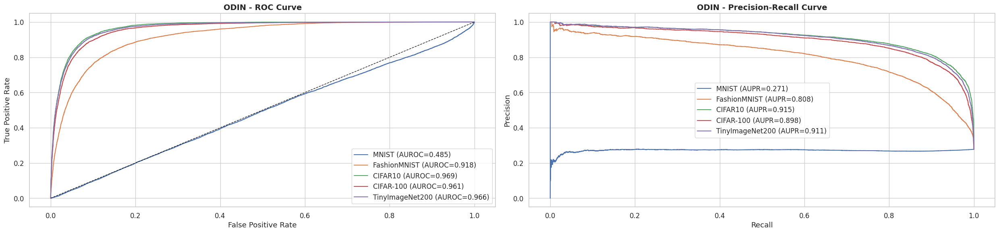

In [ ]:
plot_ood_curves(results_odin, metric)

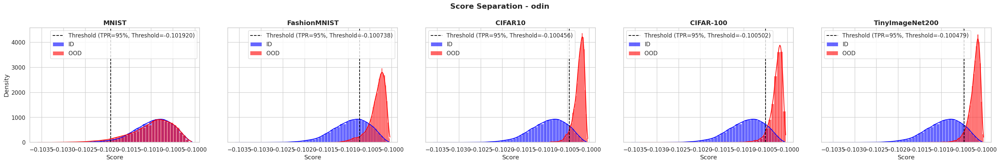

In [ ]:
plot_separation_for_method(results_odin, method_name=metric, target_tpr=0.95)

###### Energy

In [ ]:
metric = "energy"

In [ ]:
df_energy, results_energy = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - ENERGY


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID energy Mean,OOD energy Mean,Separation
0,MNIST,0.3710,0.2113,0.9908,-7.4771,-9.1368,1.6597
1,FashionMNIST,0.8550,0.5767,0.4199,-7.4771,-4.0217,3.4554
2,CIFAR10,0.9258,0.7257,0.2017,-7.4771,-3.3421,4.1350
3,CIFAR-100,0.9213,0.7291,0.2320,-7.4771,-3.3790,4.0981
4,TinyImageNet200,0.9286,0.7423,0.2056,-7.4771,-3.3071,4.1700



Avg AUROC = 0.8003 | Avg AUPR = 0.5970 | Avg FPR@95TPR = 0.4100


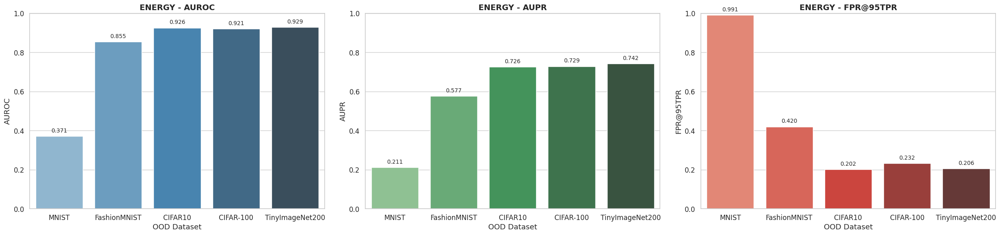

In [ ]:
plot_ood_metrics(df_energy, metric)

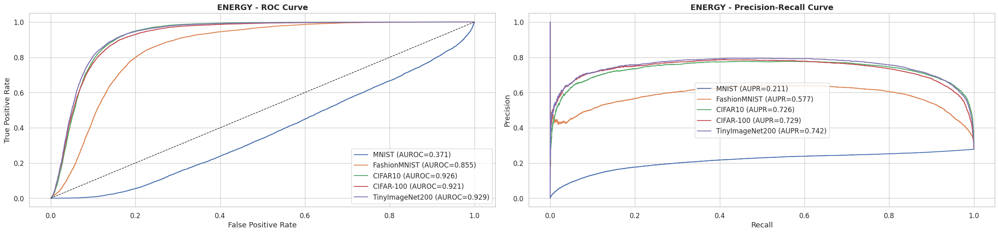

In [ ]:
plot_ood_curves(results_energy, metric)

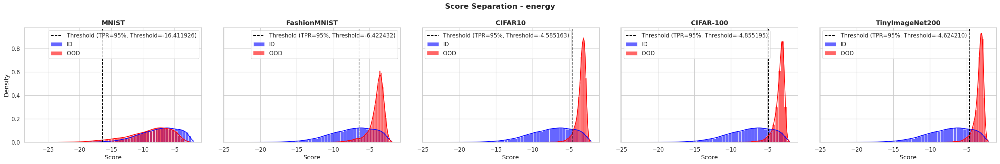

In [ ]:
plot_separation_for_method(results_energy, method_name=metric, target_tpr=0.95)

###### Mahalanobis

In [ ]:
metric = "mahalanobis"

In [ ]:
df_maha, results_maha = comprehensive_ood_analysis(
    exclude_garbage=True,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class excluded) - MAHALANOBIS


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID mahalanobis Mean,OOD mahalanobis Mean,Separation
0,MNIST,0.9906,0.9751,0.0472,-119.825302,-786.164124,666.338806
1,FashionMNIST,0.8827,0.6728,0.3785,-119.825302,-266.248993,146.423706
2,CIFAR10,0.6617,0.3816,0.7929,-119.825302,-157.899094,38.073799
3,CIFAR-100,0.6731,0.4057,0.7835,-119.825302,-168.422302,48.597000
4,TinyImageNet200,0.6472,0.3686,0.8086,-119.825302,-153.528900,33.703602



Avg AUROC = 0.7711 | Avg AUPR = 0.5608 | Avg FPR@95TPR = 0.5621


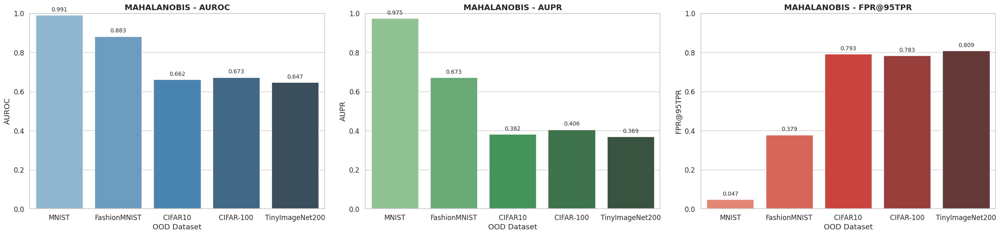

In [ ]:
plot_ood_metrics(df_maha, metric)

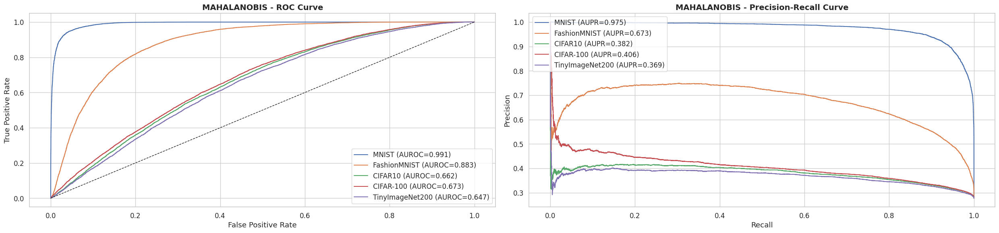

In [ ]:
plot_ood_curves(results_maha, metric)

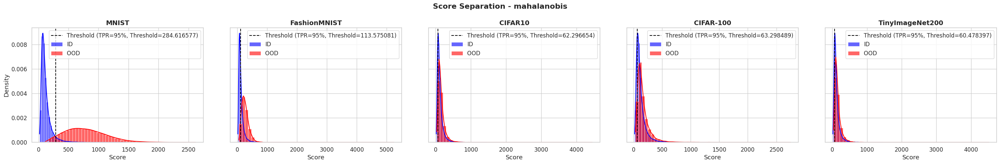

In [ ]:
plot_separation_for_method(results_maha, method_name=metric, target_tpr=0.95)

###### Comparison

In [ ]:
metric_dfs = {
    "UE": df_ue,
    "MSP": df_msp,
    "ODIN": df_odin,
    "Energy": df_energy,
    "Mahalanobis": df_maha
}

# Initialize empty dicts to store AUROC, AUPR, FPR separately
auroc_df, aupr_df, fpr95_df = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

for metric_name, df in metric_dfs.items():
    temp_df = df.set_index("OOD Dataset")
    auroc_df[metric_name] = temp_df["AUROC"]
    aupr_df[metric_name] = temp_df["AUPR"]
    fpr95_df[metric_name] = temp_df["FPR@95TPR"]

# Reset index so OOD Dataset is a column
auroc_df = auroc_df.reset_index()
aupr_df = aupr_df.reset_index()
fpr95_df = fpr95_df.reset_index()

In [ ]:
print("=== AUROC Comparison ===")
display(auroc_df)

=== AUROC Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.6033,0.6047,0.4855,0.3710,0.9906
1,FashionMNIST,0.9233,0.9207,0.9185,0.8550,0.8827
2,CIFAR10,0.9645,0.9608,0.9693,0.9258,0.6617
3,CIFAR-100,0.9574,0.9540,0.9607,0.9213,0.6731
4,TinyImageNet200,0.9614,0.9579,0.9664,0.9286,0.6472


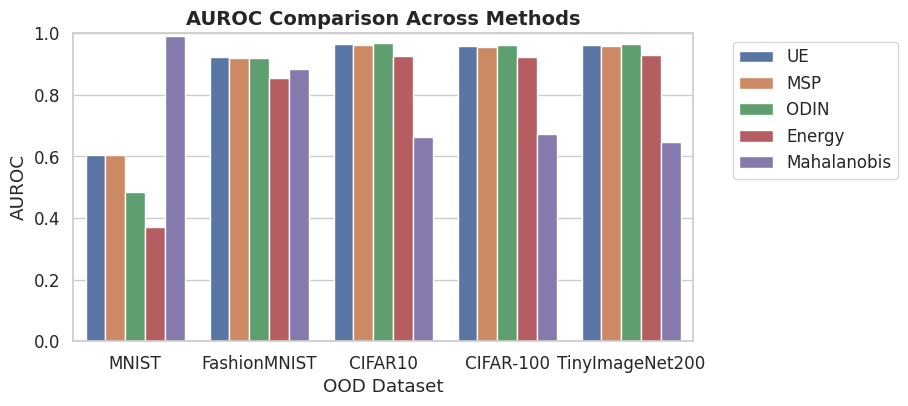

In [ ]:
plot_metric_comparison(auroc_df, "AUROC")

In [ ]:
print("=== AUPR Comparison ===")
display(aupr_df)

=== AUPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.3599,0.3657,0.2708,0.2113,0.9751
1,FashionMNIST,0.8127,0.8035,0.8081,0.5767,0.6728
2,CIFAR10,0.9047,0.8920,0.9148,0.7257,0.3816
3,CIFAR-100,0.8895,0.8771,0.8977,0.7291,0.4057
4,TinyImageNet200,0.9004,0.8883,0.9108,0.7423,0.3686


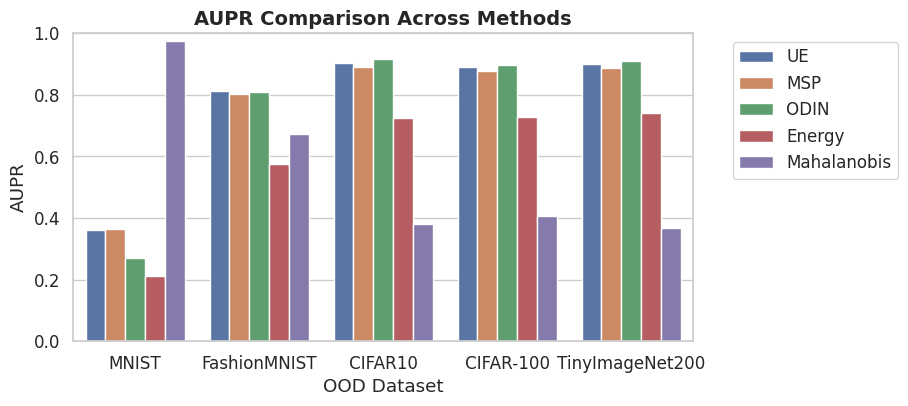

In [ ]:
plot_metric_comparison(aupr_df, "AUPR")

In [ ]:
print("=== FPR@95TPR Comparison ===")
display(fpr95_df)

=== FPR@95TPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.9624,0.9624,0.9782,0.9908,0.0472
1,FashionMNIST,0.3186,0.3188,0.3573,0.4199,0.3785
2,CIFAR10,0.1515,0.1537,0.1259,0.2017,0.7929
3,CIFAR-100,0.1698,0.1706,0.1568,0.2320,0.7835
4,TinyImageNet200,0.1647,0.1653,0.1410,0.2056,0.8086


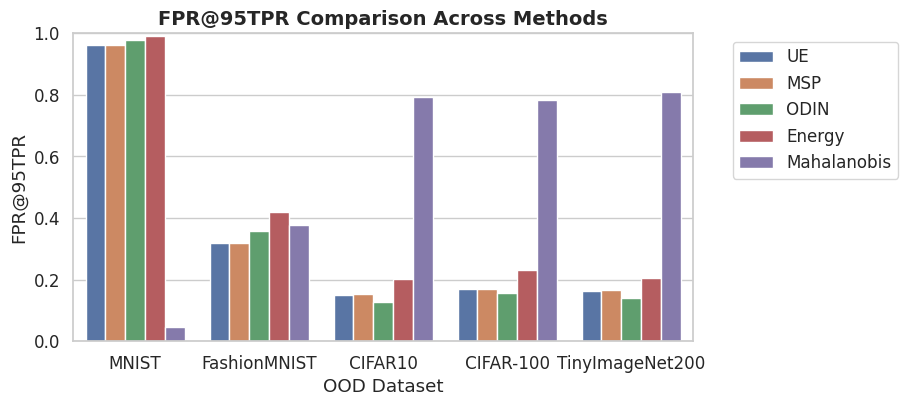

In [ ]:
plot_metric_comparison(fpr95_df, "FPR@95TPR")

##### Including Garbage class

In [ ]:
id_name = "SVHN"

In [ ]:
# Compute class statistics from ID dataset
class_means, cov_inv = compute_mahalanobis_stats(model_after_inv, datasets[id_name], device)

In [ ]:
exclude_garbage=False

###### UE

In [ ]:
metric = "ue"

In [ ]:
df_ue, results_ue = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - UE


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID ue Mean,OOD ue Mean,Separation
0,MNIST,0.6031,0.3597,0.9625,0.1238,0.2185,0.0947
1,FashionMNIST,0.9229,0.8127,0.3203,0.1238,0.6569,0.5330
2,CIFAR10,0.9636,0.9048,0.1563,0.1238,0.7784,0.6546
3,CIFAR-100,0.9537,0.8866,0.1864,0.1238,0.7525,0.6287
4,TinyImageNet200,0.9592,0.8989,0.1730,0.1238,0.7691,0.6453



Avg AUROC = 0.8805 | Avg AUPR = 0.7725 | Avg FPR@95TPR = 0.3597


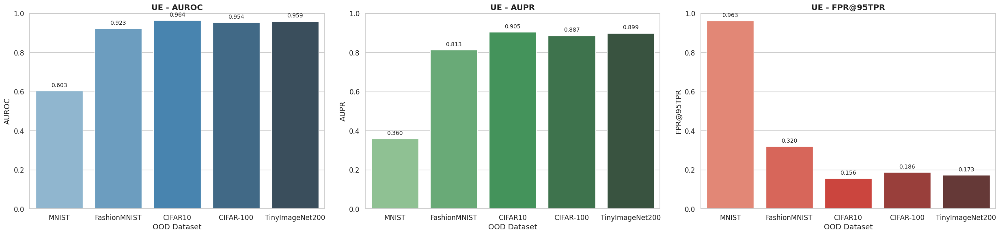

In [ ]:
plot_ood_metrics(df_ue, metric)

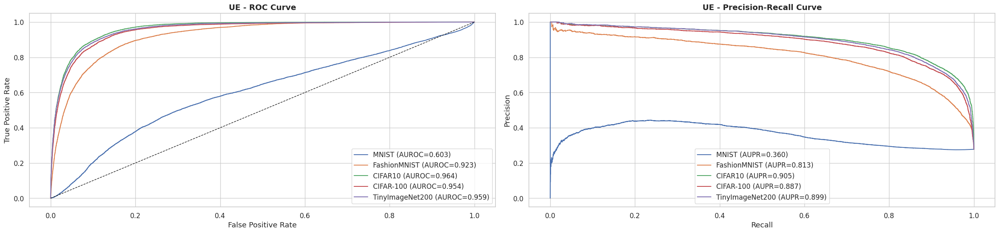

In [ ]:
plot_ood_curves(results_ue, metric)

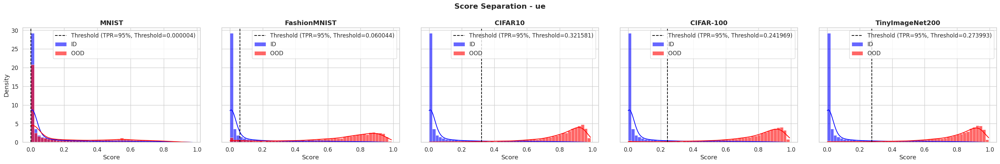

In [ ]:
plot_separation_for_method(results_ue, method_name="ue", target_tpr=0.95)

###### MSP(Max-Softmax Probability)

In [ ]:
metric = "msp"

In [ ]:
df_msp, results_msp = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name= id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - MSP


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID msp Mean,OOD msp Mean,Separation
0,MNIST,0.6046,0.3656,0.9625,0.9231,0.8582,0.0649
1,FashionMNIST,0.9204,0.8033,0.3200,0.9231,0.5292,0.3939
2,CIFAR10,0.9598,0.8915,0.1585,0.9231,0.4238,0.4992
3,CIFAR-100,0.9502,0.8737,0.1871,0.9231,0.4465,0.4766
4,TinyImageNet200,0.9556,0.8863,0.1739,0.9231,0.4301,0.4929



Avg AUROC = 0.8781 | Avg AUPR = 0.7641 | Avg FPR@95TPR = 0.3604


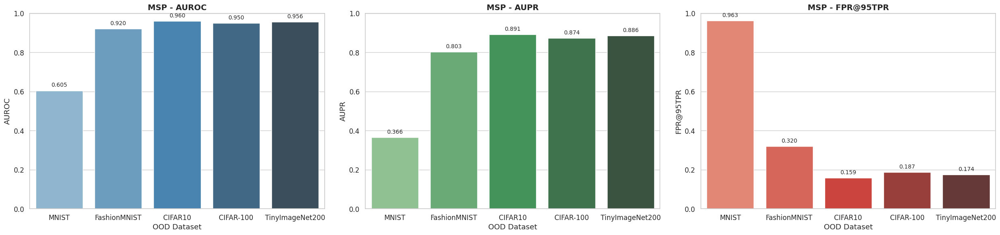

In [ ]:
plot_ood_metrics(df_msp, metric)

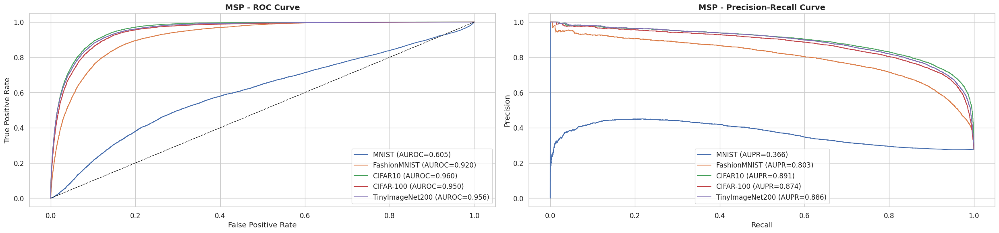

In [ ]:
plot_ood_curves(results_msp, metric)

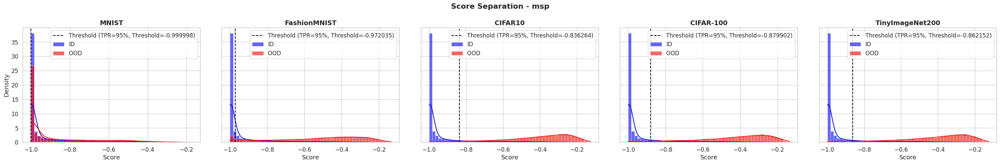

In [ ]:
plot_separation_for_method(results_msp, method_name=metric, target_tpr=0.95)

###### ODIN(Out-of-distrbution detector for Neural Networks)

In [ ]:
metric = "odin"

In [ ]:
df_odin, results_odin = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - ODIN


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID odin Mean,OOD odin Mean,Separation
0,MNIST,0.4685,0.2603,0.9799,0.0918,0.0919,0.0001
1,FashionMNIST,0.9091,0.7928,0.3981,0.0918,0.0913,0.0005
2,CIFAR10,0.9745,0.9340,0.1138,0.0918,0.0912,0.0007
3,CIFAR-100,0.9638,0.9151,0.1573,0.0918,0.0912,0.0007
4,TinyImageNet200,0.9699,0.9268,0.1327,0.0918,0.0912,0.0007



Avg AUROC = 0.8572 | Avg AUPR = 0.7658 | Avg FPR@95TPR = 0.3564


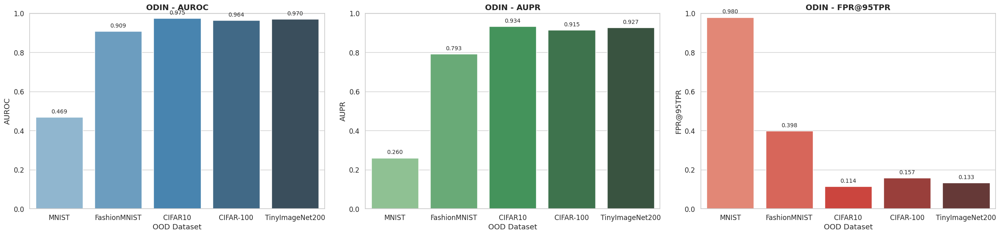

In [ ]:
plot_ood_metrics(df_odin, metric)

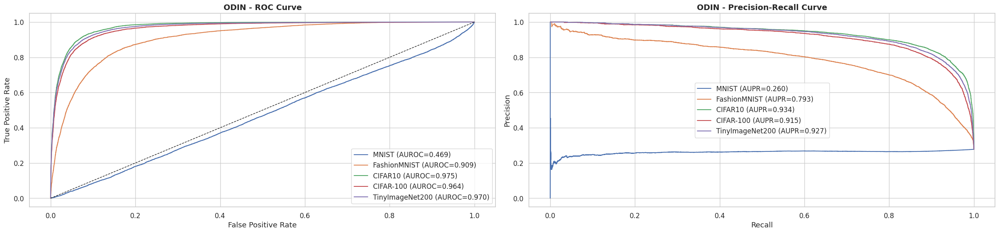

In [ ]:
plot_ood_curves(results_odin, metric)

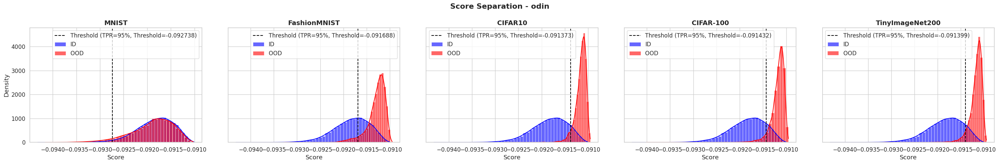

In [ ]:
plot_separation_for_method(results_odin, method_name=metric, target_tpr=0.95)

###### Energy

In [ ]:
metric = "energy"

In [ ]:
df_energy, results_energy = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - ENERGY


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID energy Mean,OOD energy Mean,Separation
0,MNIST,0.3709,0.2113,0.9908,-7.4774,-9.1371,1.6597
1,FashionMNIST,0.8542,0.5761,0.4243,-7.4774,-4.0342,3.4432
2,CIFAR10,0.9197,0.7136,0.2233,-7.4774,-3.4038,4.0736
3,CIFAR-100,0.9112,0.7118,0.2680,-7.4774,-3.4787,3.9987
4,TinyImageNet200,0.9211,0.7283,0.2344,-7.4774,-3.3838,4.0936



Avg AUROC = 0.7954 | Avg AUPR = 0.5882 | Avg FPR@95TPR = 0.4282


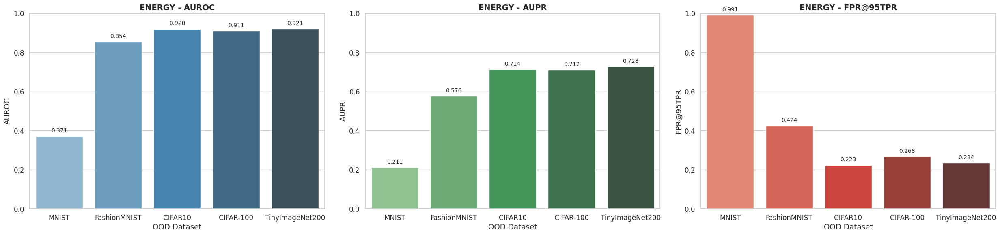

In [ ]:
plot_ood_metrics(df_energy, metric)

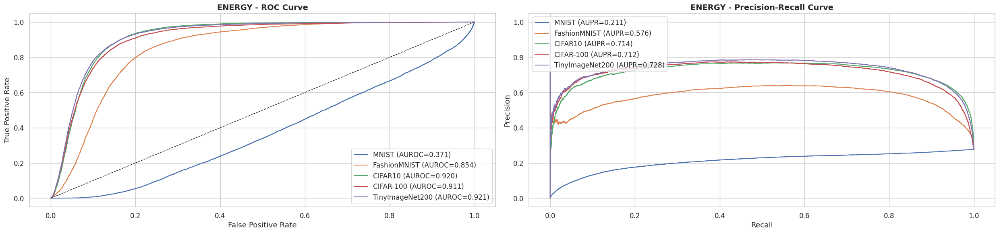

In [ ]:
plot_ood_curves(results_energy, metric)

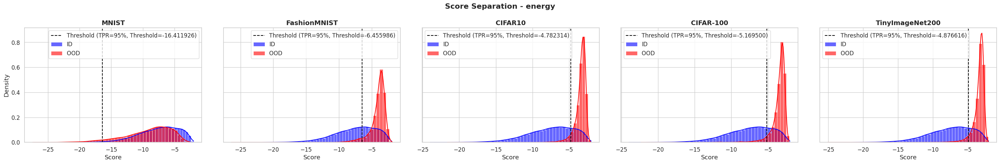

In [ ]:
plot_separation_for_method(results_energy, method_name=metric, target_tpr=0.95)

###### Mahalanobis

In [ ]:
metric = "mahalanobis"

In [ ]:
df_maha, results_maha = comprehensive_ood_analysis(
    exclude_garbage,
    model=model_after_inv,
    datasets=datasets,
    device=device,
    metric_name= metric,
    id_name=id_name,
    temperature=temperature if metric=="odin" else 1.0,
    class_means=class_means if metric=="mahalanobis" else None,
    cov_inv=cov_inv if metric=="mahalanobis" else None)

COMPREHENSIVE OOD ANALYSIS (Garbage class included) - MAHALANOBIS


,OOD Dataset,AUROC,AUPR,FPR@95TPR,ID mahalanobis Mean,OOD mahalanobis Mean,Separation
0,MNIST,0.9906,0.9751,0.0472,-119.825302,-786.164124,666.338806
1,FashionMNIST,0.8827,0.6728,0.3785,-119.825302,-266.248993,146.423706
2,CIFAR10,0.6617,0.3816,0.7929,-119.825302,-157.899094,38.073799
3,CIFAR-100,0.6731,0.4057,0.7835,-119.825302,-168.422302,48.597000
4,TinyImageNet200,0.6472,0.3686,0.8086,-119.825302,-153.528900,33.703602



Avg AUROC = 0.7711 | Avg AUPR = 0.5608 | Avg FPR@95TPR = 0.5621


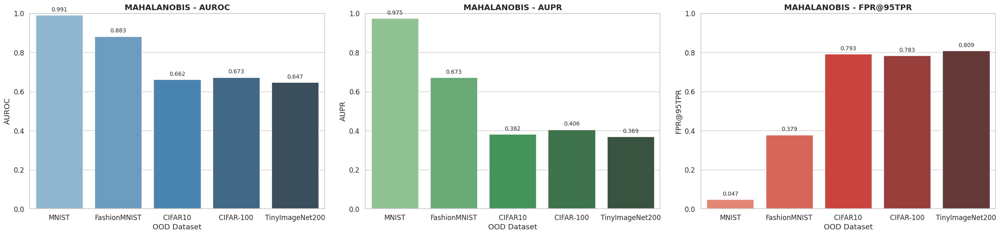

In [ ]:
plot_ood_metrics(df_maha, metric)

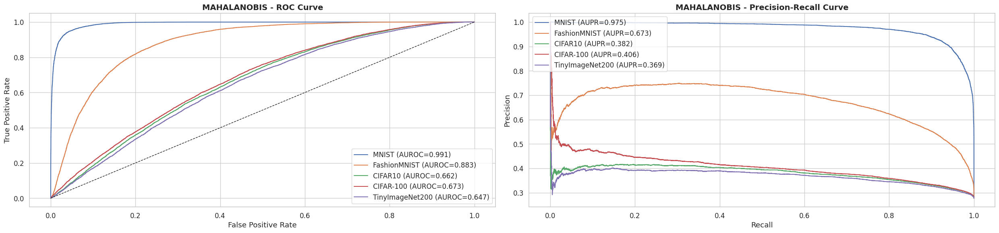

In [ ]:
plot_ood_curves(results_maha, metric)

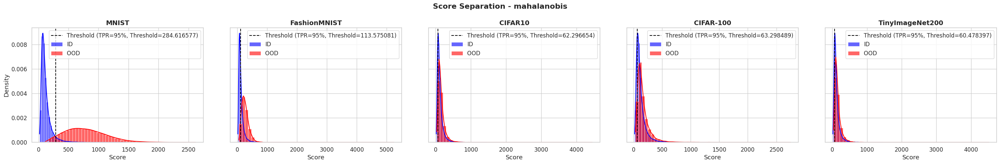

In [ ]:
plot_separation_for_method(results_maha, method_name=metric, target_tpr=0.95)

###### Comparison

In [ ]:
metric_dfs = {
    "UE": df_ue,
    "MSP": df_msp,
    "ODIN": df_odin,
    "Energy": df_energy,
    "Mahalanobis": df_maha
}

# Initialize empty dicts to store AUROC, AUPR, FPR separately
auroc_df, aupr_df, fpr95_df = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

for metric_name, df in metric_dfs.items():
    temp_df = df.set_index("OOD Dataset")
    auroc_df[metric_name] = temp_df["AUROC"]
    aupr_df[metric_name] = temp_df["AUPR"]
    fpr95_df[metric_name] = temp_df["FPR@95TPR"]

# Reset index so OOD Dataset is a column
auroc_df = auroc_df.reset_index()
aupr_df = aupr_df.reset_index()
fpr95_df = fpr95_df.reset_index()

In [ ]:
print("=== AUROC Comparison ===")
display(auroc_df)

=== AUROC Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.6031,0.6046,0.4685,0.3709,0.9906
1,FashionMNIST,0.9229,0.9204,0.9091,0.8542,0.8827
2,CIFAR10,0.9636,0.9598,0.9745,0.9197,0.6617
3,CIFAR-100,0.9537,0.9502,0.9638,0.9112,0.6731
4,TinyImageNet200,0.9592,0.9556,0.9699,0.9211,0.6472


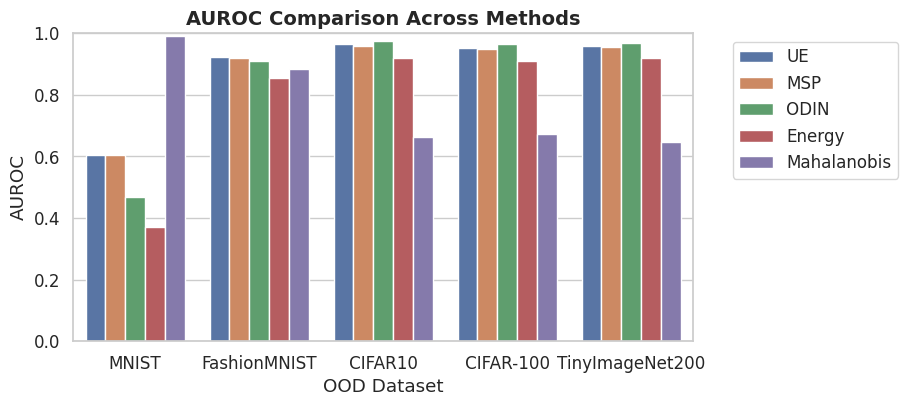

In [ ]:
plot_metric_comparison(auroc_df, "AUROC")

In [ ]:
print("=== AUPR Comparison ===")
display(aupr_df)

=== AUPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.3597,0.3656,0.2603,0.2113,0.9751
1,FashionMNIST,0.8127,0.8033,0.7928,0.5761,0.6728
2,CIFAR10,0.9048,0.8915,0.9340,0.7136,0.3816
3,CIFAR-100,0.8866,0.8737,0.9151,0.7118,0.4057
4,TinyImageNet200,0.8989,0.8863,0.9268,0.7283,0.3686


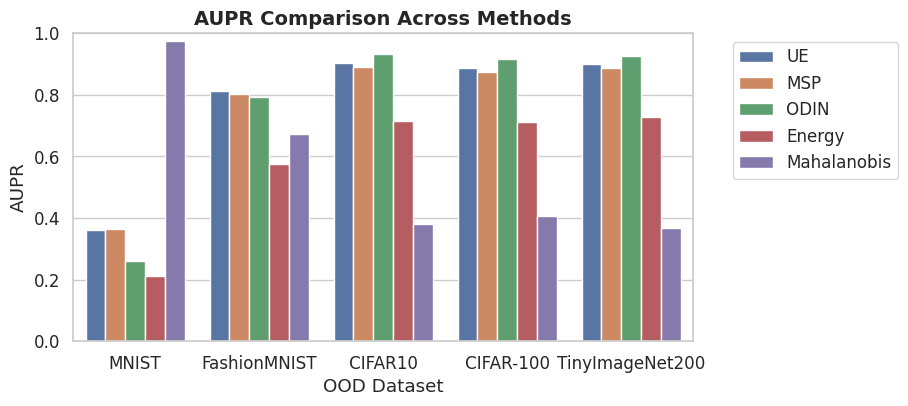

In [ ]:
plot_metric_comparison(aupr_df, "AUPR")

In [ ]:
print("=== FPR@95TPR Comparison ===")
display(fpr95_df)

=== FPR@95TPR Comparison ===


,OOD Dataset,UE,MSP,ODIN,Energy,Mahalanobis
0,MNIST,0.9625,0.9625,0.9799,0.9908,0.0472
1,FashionMNIST,0.3203,0.3200,0.3981,0.4243,0.3785
2,CIFAR10,0.1563,0.1585,0.1138,0.2233,0.7929
3,CIFAR-100,0.1864,0.1871,0.1573,0.2680,0.7835
4,TinyImageNet200,0.1730,0.1739,0.1327,0.2344,0.8086


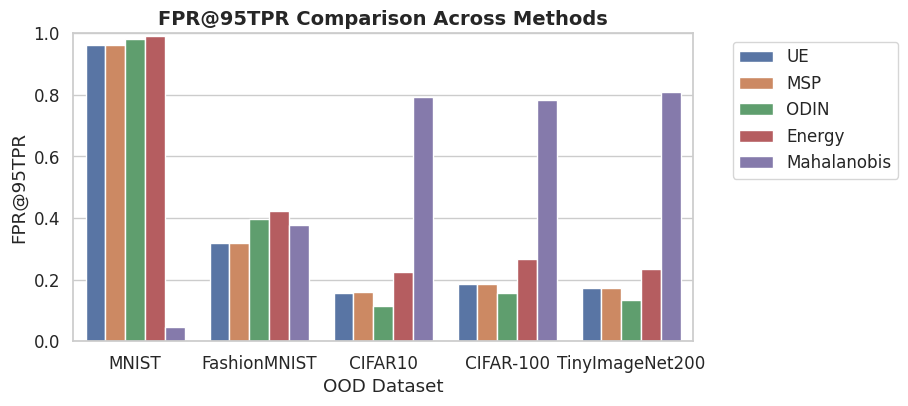

In [ ]:
plot_metric_comparison(fpr95_df, "FPR@95TPR")